# Exploração de Dados das Tabelas

Neste notebook, realizaremos uma exploração detalhada dos dados obtidos por aparelho e por dia. O objetivo é comparar os resultados entre os diferentes dispositivos e analisar as diferenças entre eles. Vamos visualizar esses dados de diversas maneiras e extrair insights relevantes para nossa análise.

## Objetivos:
- Comparar os resultados dos diferentes aparelhos.
- Analisar as diferenças entre os dados coletados por cada dispositivo.
- Visualizar os dados de forma estratificada para identificar padrões ou tendências.

## Etapas de Exploração:
1. Carregamento e pré-processamento dos dados.
2. Análise estatística descritiva.
3. Visualização dos dados por meio de gráficos e plots.
4. Comparação entre os aparelhos e os dias.
5. Identificação de diferenças significativas.
6. Exploração de correlações entre as variáveis.
7. Análise de tendências ao longo do tempo.
8. Extração de insights e conclusões.

## Por que explorar os dados de forma atomizada?
Ao explorar os dados de forma atomizada, ou seja, analisando cada aparelho e dia separadamente, podemos identificar padrões e variações específicas de cada dispositivo. Isso nos permite entender melhor o desempenho de cada aparelho em diferentes condições e contextos, além de nos ajudar a detectar possíveis problemas ou anomalias em determinados dias ou momentos.

## Por que comparar os resultados em dias diferentes e aparelhos diferentes?
A comparação entre os resultados em dias diferentes nos permite avaliar a consistência dos dados ao longo do tempo e identificar possíveis variações sazonais ou tendências. Por outro lado, a comparação entre os aparelhos nos ajuda a entender como diferentes dispositivos se comportam em situações semelhantes e a identificar possíveis disparidades ou discrepâncias entre eles.

## Por que visualizar os dados de forma estratificada?
A visualização dos dados de forma estratificada nos permite identificar padrões e tendências que podem estar ocultos em uma análise agregada. Ao segmentar os dados por diferentes variáveis, como hora do dia, localização ou condições ambientais, podemos obter insights mais detalhados sobre o comportamento dos dispositivos e as relações entre as variáveis.

Vamos começar nossa jornada de exploração de dados e descobrir o que podemos aprender com essas informações!


_____
## Importação de Bibliotecas e Código

Nesta seção, importaremos as bibliotecas necessárias para nossa análise exploratória de dados e escreveremos o código para carregar e processar os dados.
Vamos começar importando as bibliotecas:


In [66]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats


## Importação dos Arquivos JSON

Nesta etapa, vamos importar os dados JSON dos quatro aparelhos em dois dias para realizar nossa análise exploratória de dados. Os dados serão carregados e armazenados em estruturas de dados apropriadas para facilitar a análise.


In [4]:
# Lista de nomes dos arquivos JSON
arquivos_json = ["Aparelho1Dia1.json", "Aparelho2Dia1.json", "Aparelho3Dia1.json", "Aparelho4Dia1.json",
                 "Aparelho1Dia2.json", "Aparelho2Dia2.json", "Aparelho3Dia2.json", "Aparelho4Dia2.json"]

# Dicionário para armazenar os dados de cada arquivo JSON
dados_por_arquivo = {}

# Importar os dados de cada arquivo JSON e armazenar no dicionário
for arquivo_json in arquivos_json:
    with open(arquivo_json, "r") as arquivo:
        dados = json.load(arquivo)
        dados_por_arquivo[arquivo_json] = dados

print("Dados importados com sucesso!")


Dados importados com sucesso!


In [10]:
# Lista para armazenar os DataFrames de cada arquivo JSON
dataframes = []

# Iterar sobre cada arquivo JSON na lista de nomes de arquivos
for arquivo_json in arquivos_json:
    # Carregar os dados do arquivo JSON
    with open(arquivo_json, "r") as arquivo:
        dados = json.load(arquivo)
    
    # Converter os dados em um DataFrame
    df = pd.DataFrame(dados)
    
    # Adicionar uma coluna com o nome do arquivo para identificação
    df['Arquivo'] = arquivo_json
    
    # Adicionar o DataFrame à lista
    dataframes.append(df)

# Concatenar todos os DataFrames em um único DataFrame
df_concatenado = pd.concat(dataframes, ignore_index=True)

# Exibir as primeiras linhas do DataFrame concatenado
print(df_concatenado.head())




                                           gnss_data             Arquivo
0  {'latitude': -25.315828333333336, 'longitude':...  Aparelho1Dia1.json
1  {'latitude': -25.315838333333332, 'longitude':...  Aparelho1Dia1.json
2  {'latitude': -25.315845, 'longitude': -54.0593...  Aparelho1Dia1.json
3  {'latitude': -25.31584, 'longitude': -54.05936...  Aparelho1Dia1.json
4  {'latitude': -25.315841666666664, 'longitude':...  Aparelho1Dia1.json


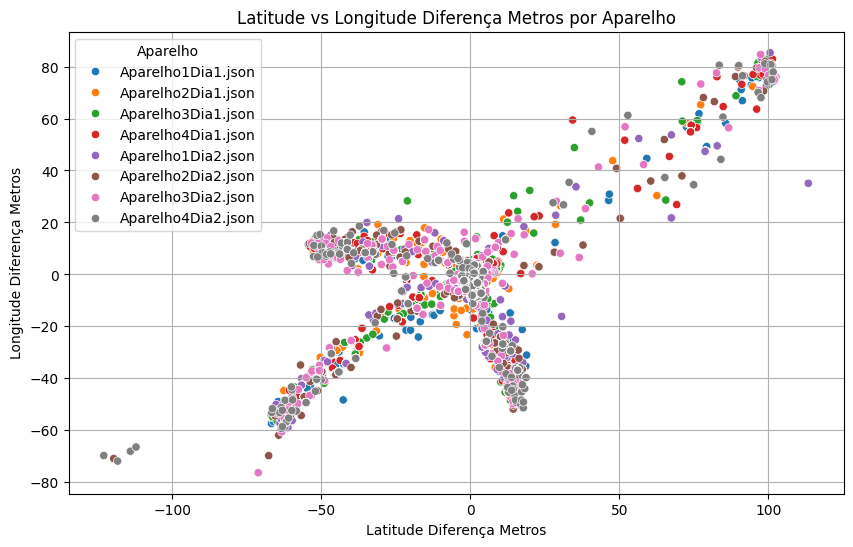

In [12]:
# Calcular as diferenças de latitude e longitude em metros
df_concatenado['latitudeDiferencaMetros'] = df_concatenado['gnss_data'].apply(lambda x: float(x['latitudeDiferencaMetros']))
df_concatenado['longitudeDiferencaMetros'] = df_concatenado['gnss_data'].apply(lambda x: float(x['longitudeDiferencaMetros']))

# Plotar latitude e longitude diferença metros por aparelho
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_concatenado, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', hue='Arquivo')
plt.title('Latitude vs Longitude Diferença Metros por Aparelho')
plt.xlabel('Latitude Diferença Metros')
plt.ylabel('Longitude Diferença Metros')
plt.legend(title='Aparelho')
plt.grid(True)
plt.show()



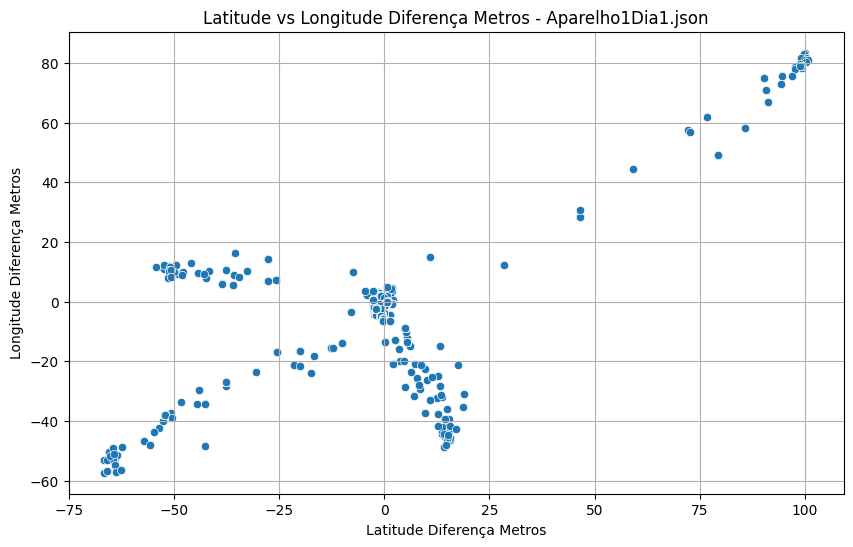

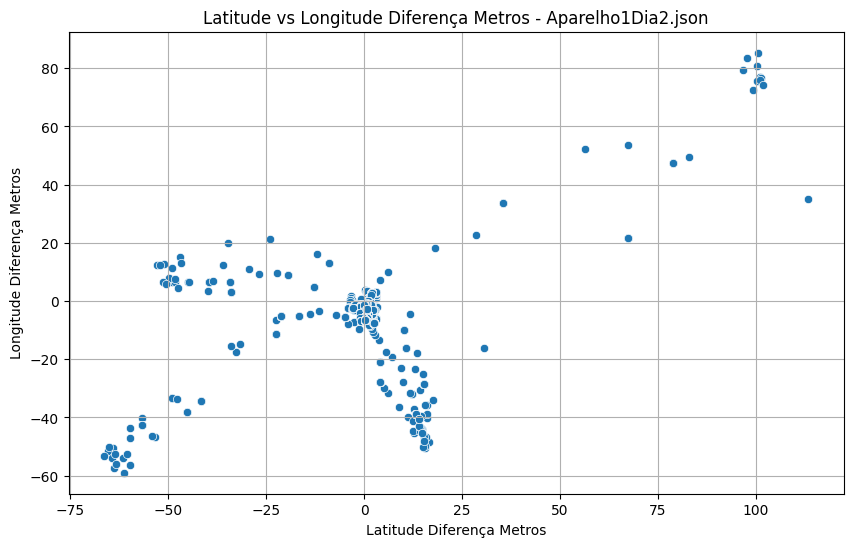

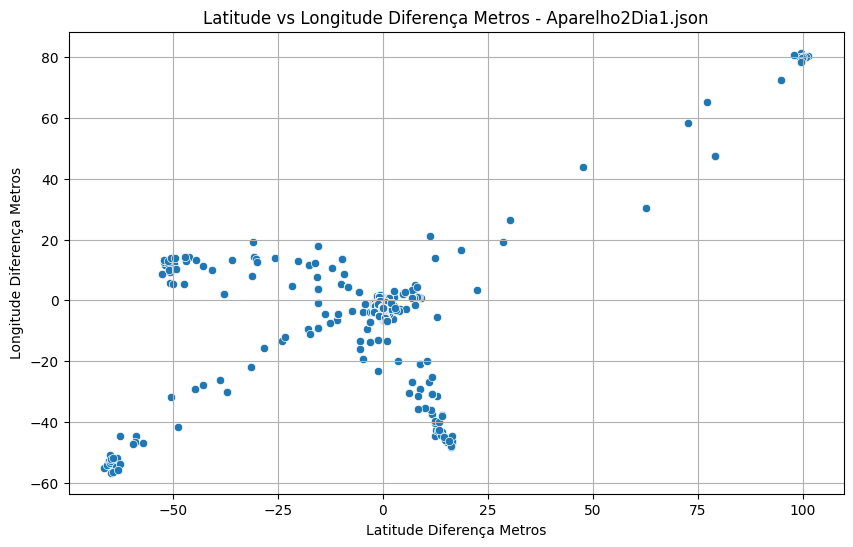

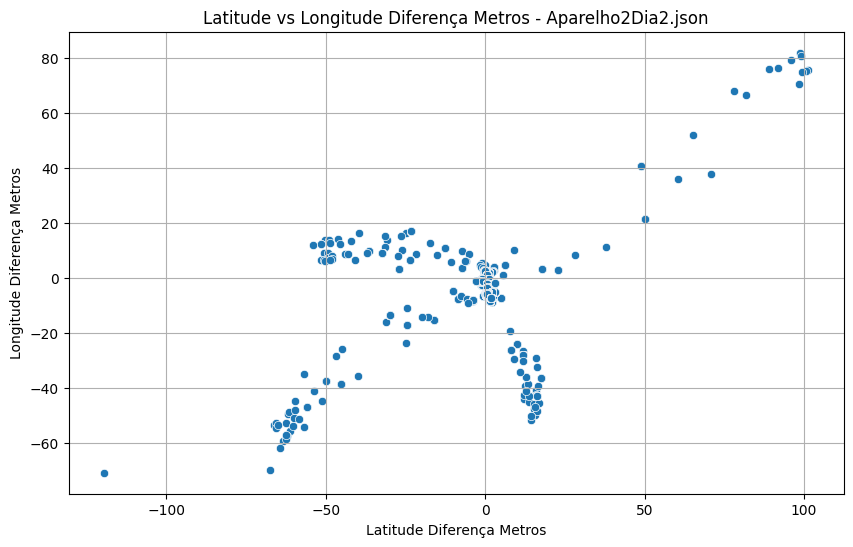

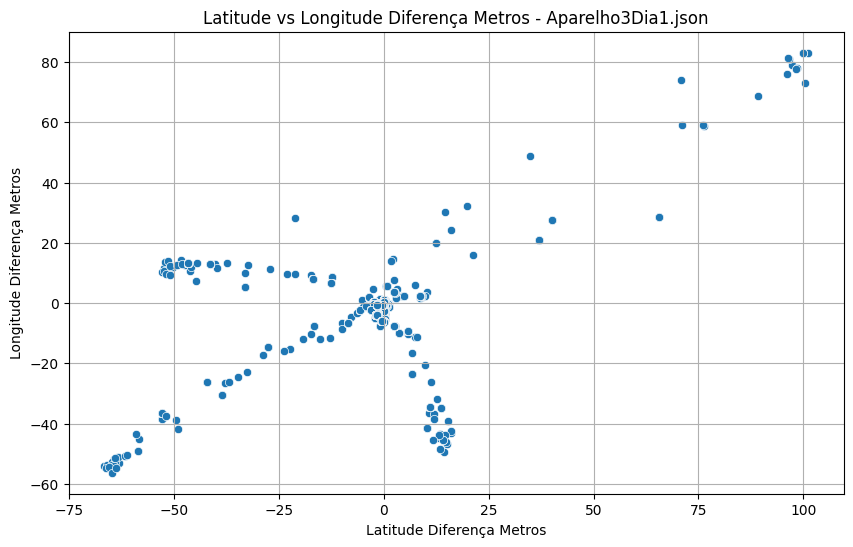

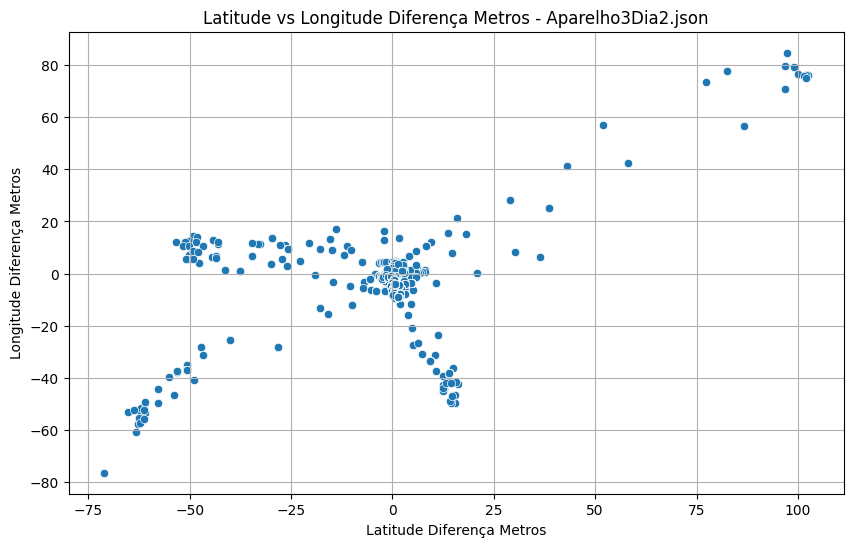

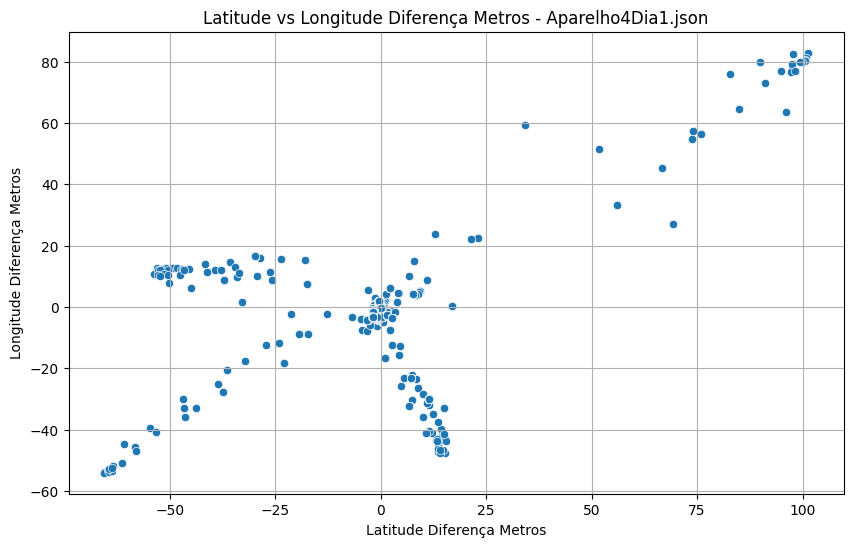

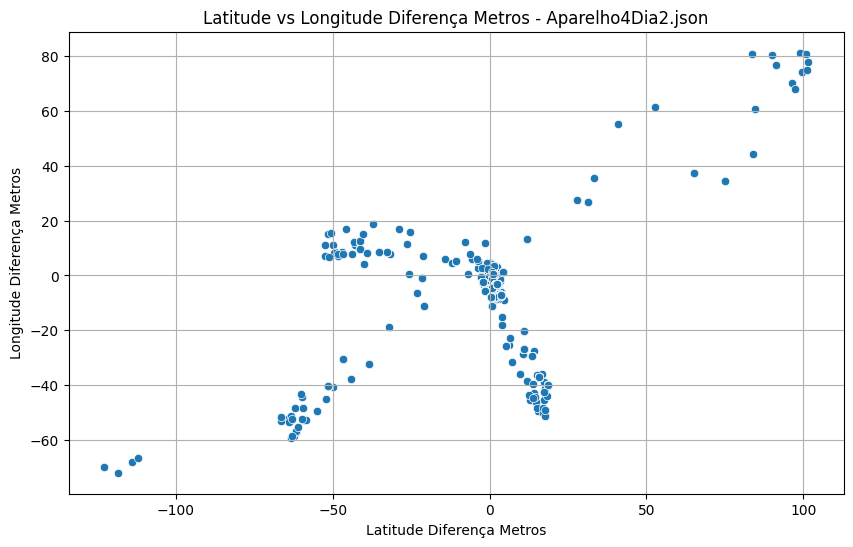

In [18]:
# Separar os dados por aparelho
grupos_por_aparelho = df_concatenado.groupby('Arquivo')

# Plotar latitude e longitude diferença metros por aparelho
for aparelho, dados_aparelho in grupos_por_aparelho:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=dados_aparelho, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros')
    plt.title(f'Latitude vs Longitude Diferença Metros - {aparelho}')
    plt.xlabel('Latitude Diferença Metros')
    plt.ylabel('Longitude Diferença Metros')
    plt.grid(True)
    plt.show()



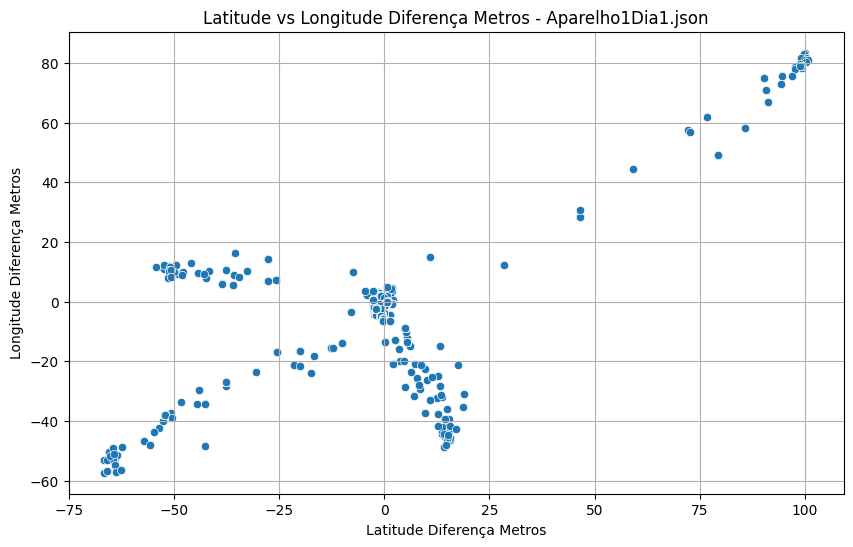

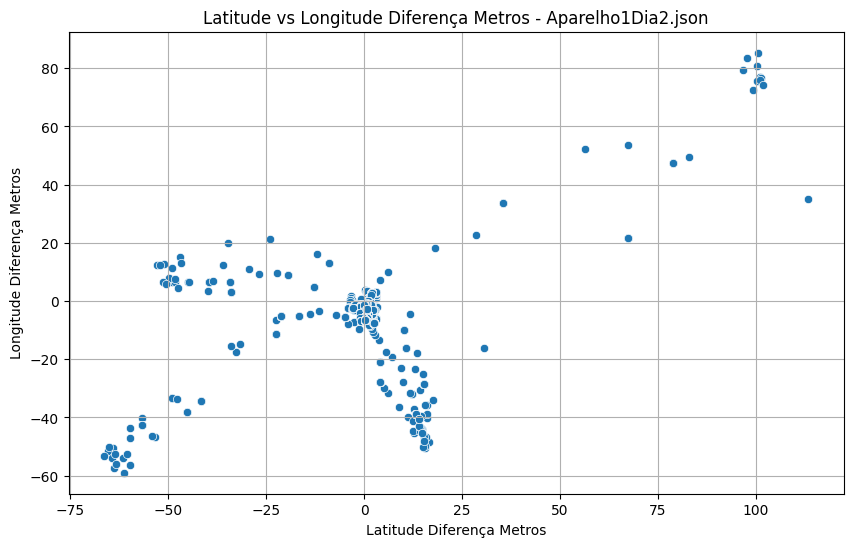

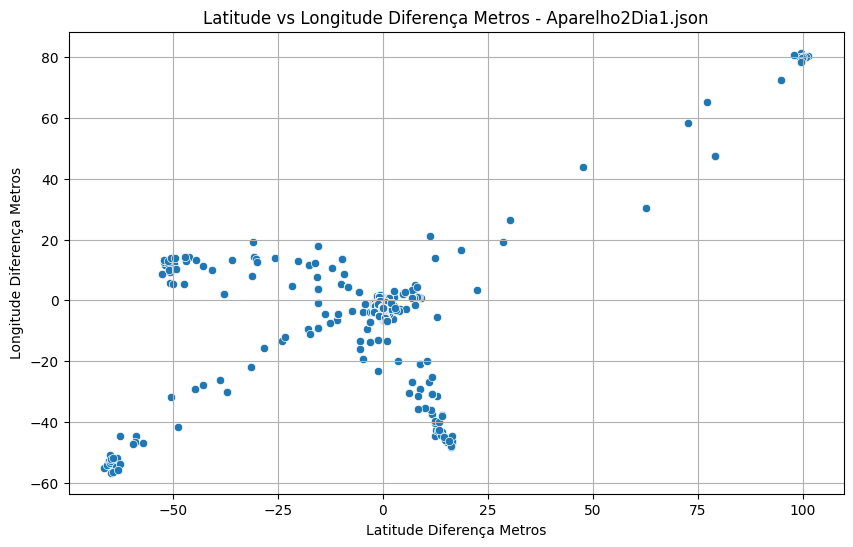

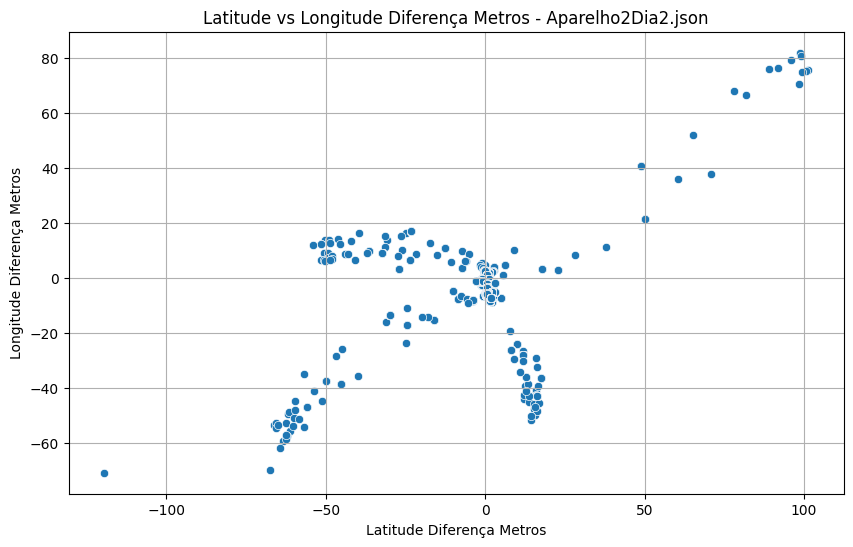

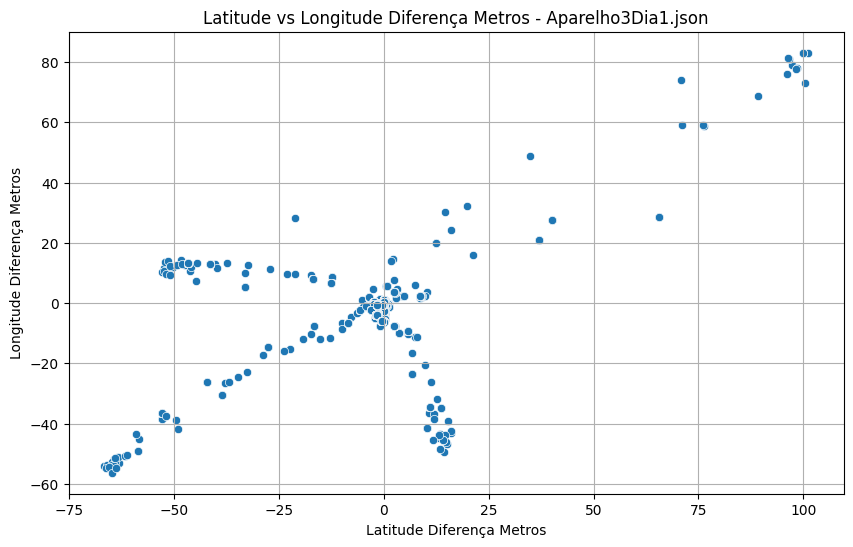

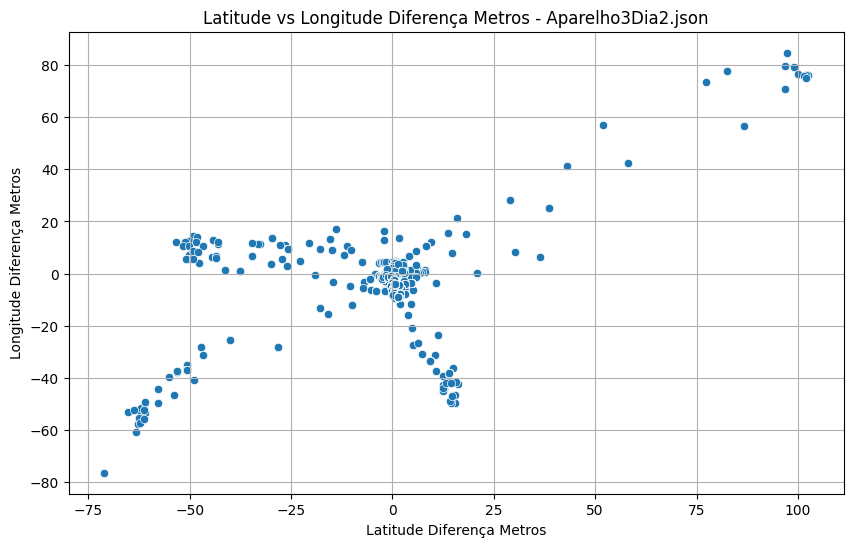

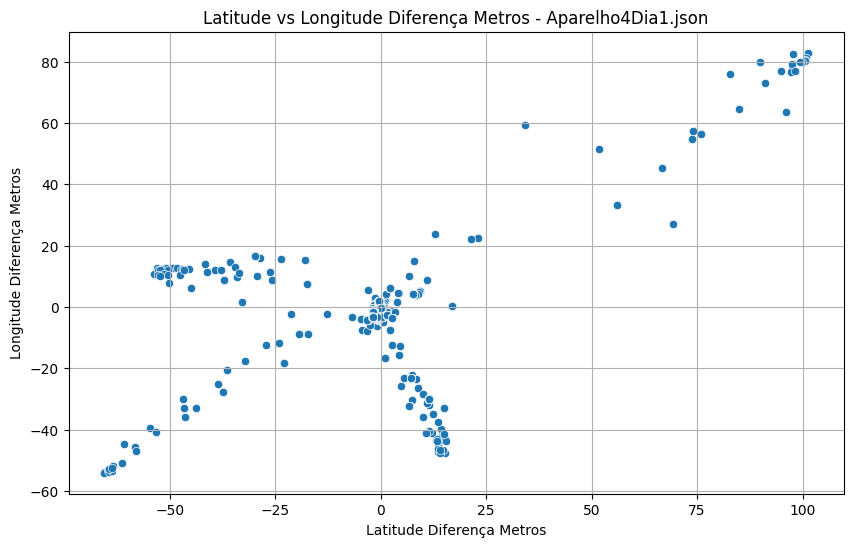

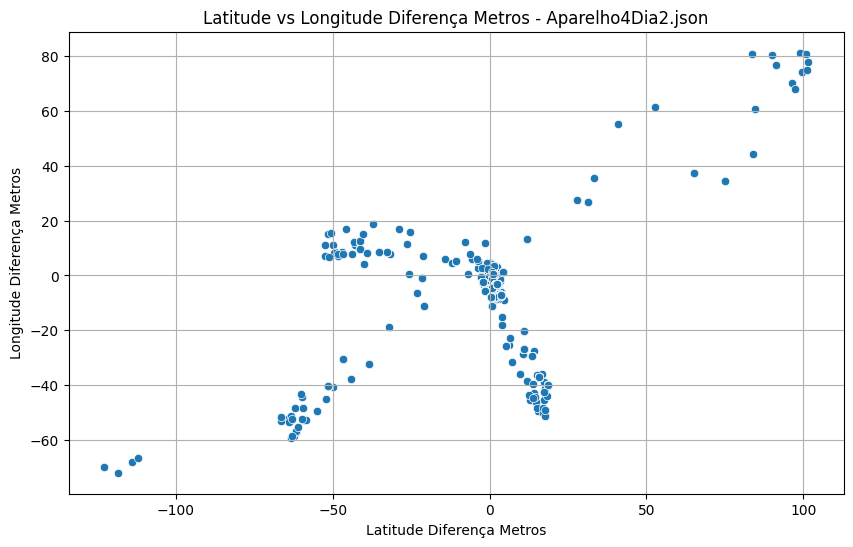

In [27]:
# Plotar latitude e longitude diferença metros por aparelho
for aparelho, dados_aparelho in df_concatenado.groupby('Arquivo'):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=dados_aparelho, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros')
    plt.title(f'Latitude vs Longitude Diferença Metros - {aparelho}')
    plt.xlabel('Latitude Diferença Metros')
    plt.ylabel('Longitude Diferença Metros')
    plt.grid(True)
    plt.show()

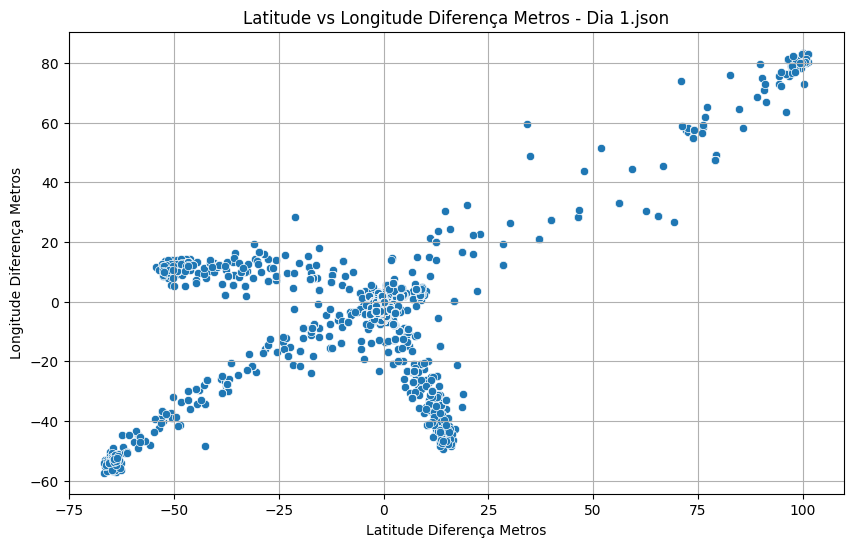

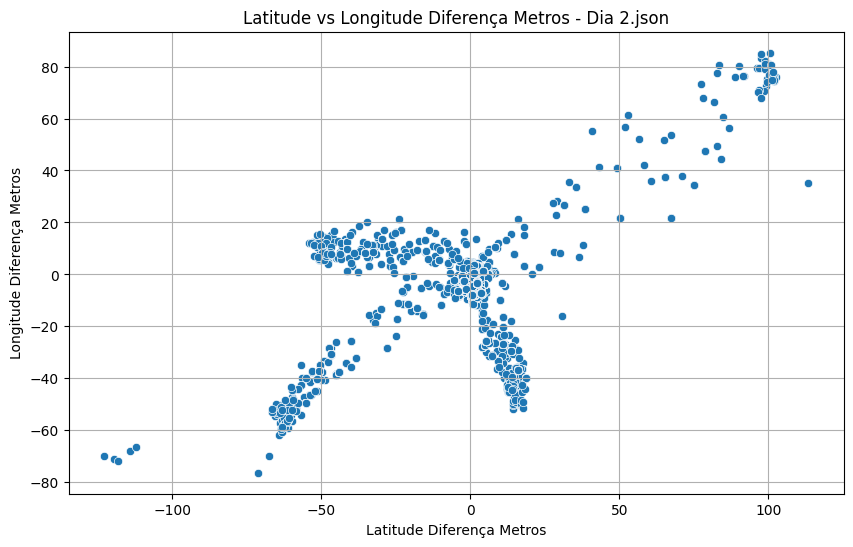

In [29]:
# Separar os dados por dia
grupos_por_dia = df_concatenado.groupby(df_concatenado['Arquivo'].str.split('Dia').str[1])

for dia, dados_dia in grupos_por_dia:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=dados_dia, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros')
    plt.title(f'Latitude vs Longitude Diferença Metros - Dia {dia}')
    plt.xlabel('Latitude Diferença Metros')
    plt.ylabel('Longitude Diferença Metros')
    plt.grid(True)
    plt.show()


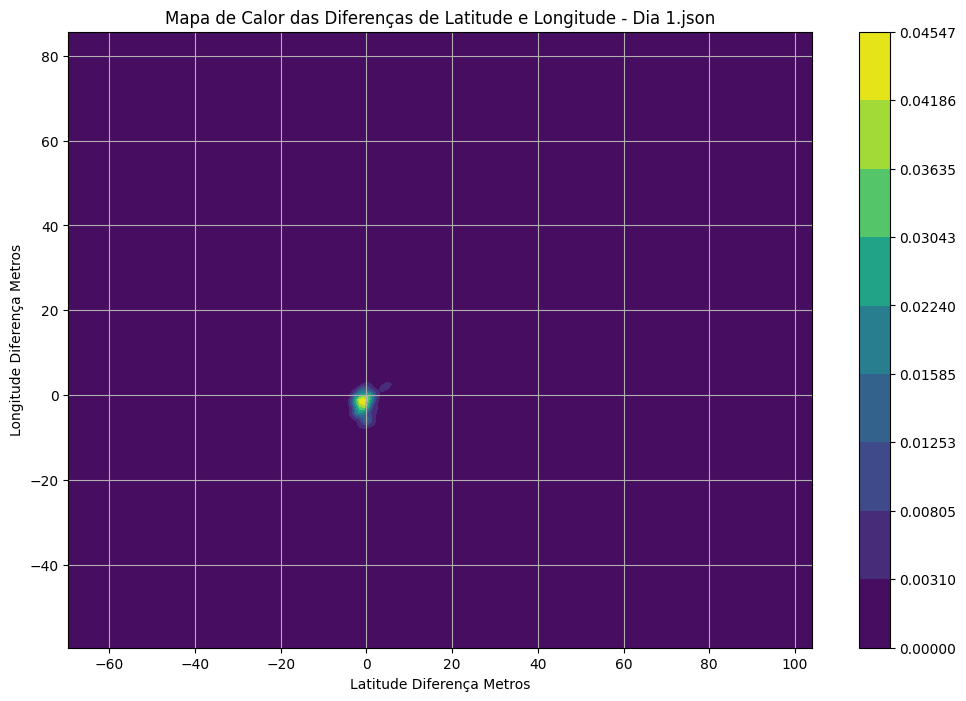

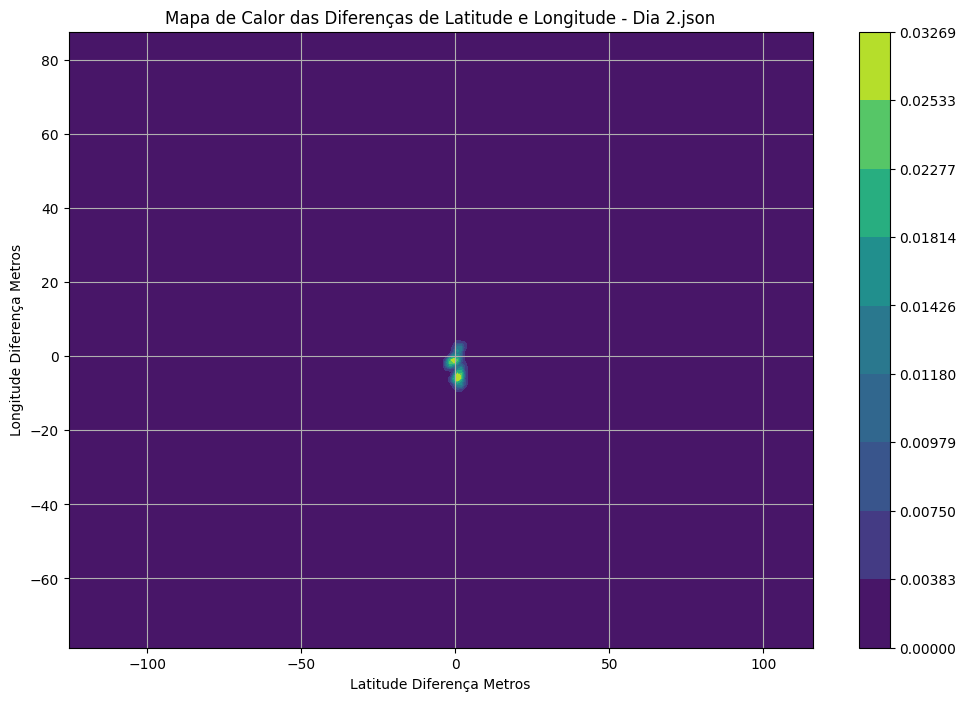

In [45]:
# Separar os dados por dia
grupos_por_dia = df_concatenado.groupby(df_concatenado['Arquivo'].str.split('Dia').str[1])

for dia, dados_dia in grupos_por_dia:
    plt.figure(figsize=(12, 8))  # Ajuste o tamanho da figura conforme desejado
    sns.kdeplot(data=dados_dia, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', cmap='viridis', fill=True, cbar=True, thresh=0)
    plt.title(f'Mapa de Calor das Diferenças de Latitude e Longitude - Dia {dia}')
    plt.xlabel('Latitude Diferença Metros')
    plt.ylabel('Longitude Diferença Metros')
    plt.grid(True)
    plt.show()

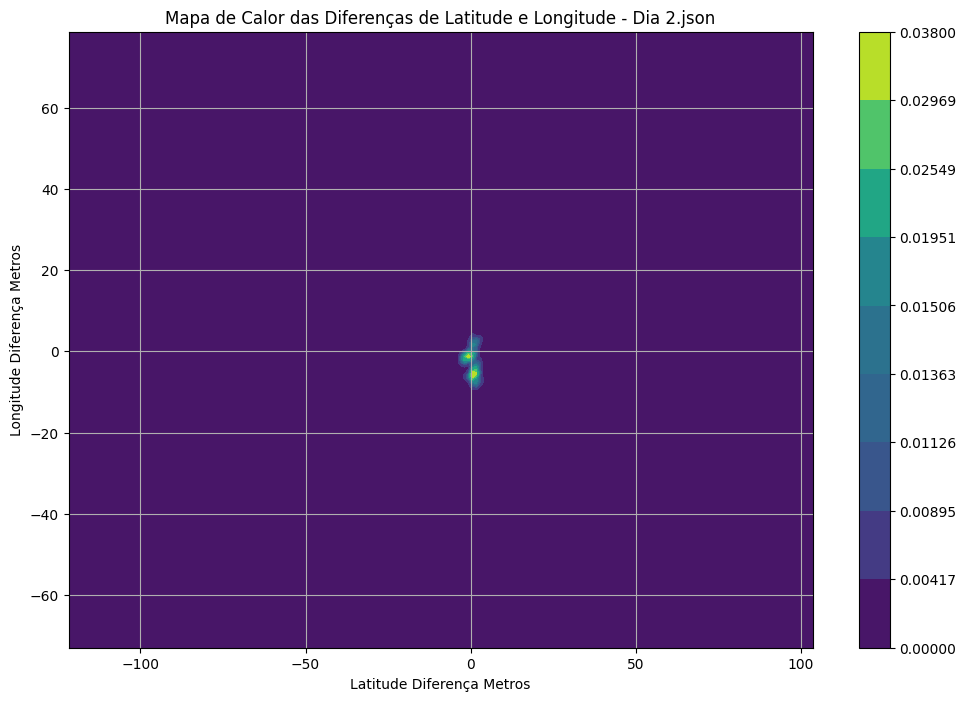

In [48]:
# Filtrar os dados para ignorar aqueles com speed maior que zero
dados_dia_filtrados = dados_dia[dados_dia['gnss_data'].apply(lambda x: x['speed'] == 0)]

plt.figure(figsize=(12, 8))  # Ajuste o tamanho da figura conforme desejado
sns.kdeplot(data=dados_dia_filtrados, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', cmap='viridis', fill=True, cbar=True, thresh=0)
plt.title(f'Mapa de Calor das Diferenças de Latitude e Longitude - Dia {dia}')
plt.xlabel('Latitude Diferença Metros')
plt.ylabel('Longitude Diferença Metros')
plt.grid(True)
plt.show()


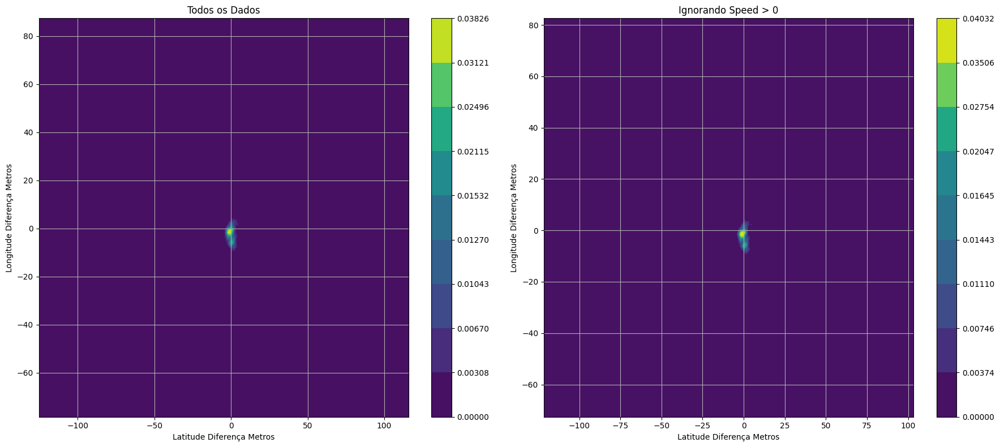

In [49]:
fig, axs = plt.subplots(1, 2, figsize=(18, 8))  # Criar subplots

# Plotar mapa de calor de todos os dados de latitude e longitude
sns.kdeplot(data=df_concatenado, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', cmap='viridis', fill=True, cbar=True, thresh=0, ax=axs[0])
axs[0].set_title('Todos os Dados')
axs[0].set_xlabel('Latitude Diferença Metros')
axs[0].set_ylabel('Longitude Diferença Metros')
axs[0].grid(True)

# Filtrar os dados para ignorar aqueles com speed maior que zero
df_filtered = df_concatenado[df_concatenado['gnss_data'].apply(lambda x: x['speed'] <= 0)]

# Plotar mapa de calor ignorando os dados com speed > 0
sns.kdeplot(data=df_filtered, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', cmap='viridis', fill=True, cbar=True, thresh=0, ax=axs[1])
axs[1].set_title('Ignorando Speed > 0')
axs[1].set_xlabel('Latitude Diferença Metros')
axs[1].set_ylabel('Longitude Diferença Metros')
axs[1].grid(True)

plt.tight_layout()  # Ajustar layout para evitar sobreposição
plt.show()


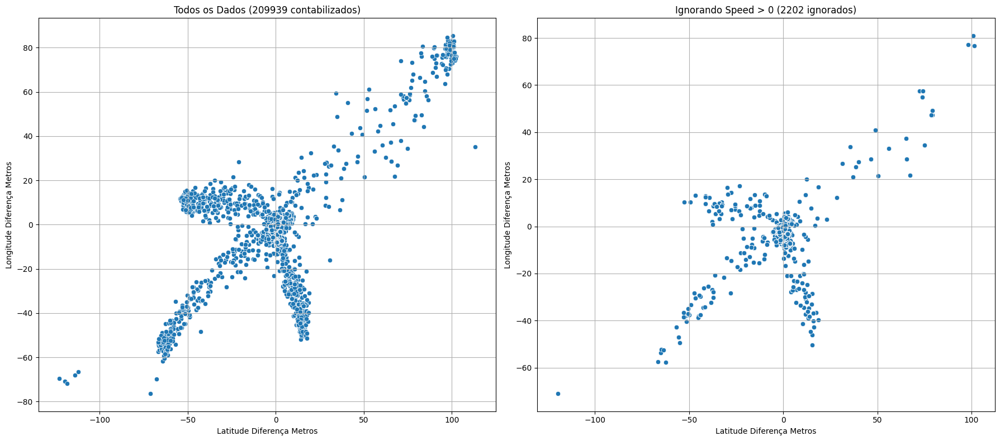

In [53]:
fig, axs = plt.subplots(1, 2, figsize=(18, 8))  # Criar subplots

# Contar quantos dados foram contabilizados
num_contabilizados = len(df_concatenado)

# Plotar gráfico de dispersão de todos os dados de latitude e longitude
sns.scatterplot(data=df_concatenado, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', ax=axs[0])
axs[0].set_title(f'Todos os Dados ({num_contabilizados} contabilizados)')
axs[0].set_xlabel('Latitude Diferença Metros')
axs[0].set_ylabel('Longitude Diferença Metros')
axs[0].grid(True)

# Filtrar os dados para ignorar aqueles com speed maior que zero
df_filtered = df_concatenado[df_concatenado['gnss_data'].apply(lambda x: x['speed'] <= 0)]

# Plotar gráfico de dispersão ignorando os dados com speed > 0
sns.scatterplot(data=df_filtered, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', ax=axs[1])
num_ignorados = len(df_concatenado) - len(df_filtered)
axs[1].set_title(f'Ignorando Speed > 0 ({num_ignorados} ignorados)')
axs[1].set_xlabel('Latitude Diferença Metros')
axs[1].set_ylabel('Longitude Diferença Metros')
axs[1].grid(True)

plt.tight_layout()  # Ajustar layout para evitar sobreposição
plt.show()


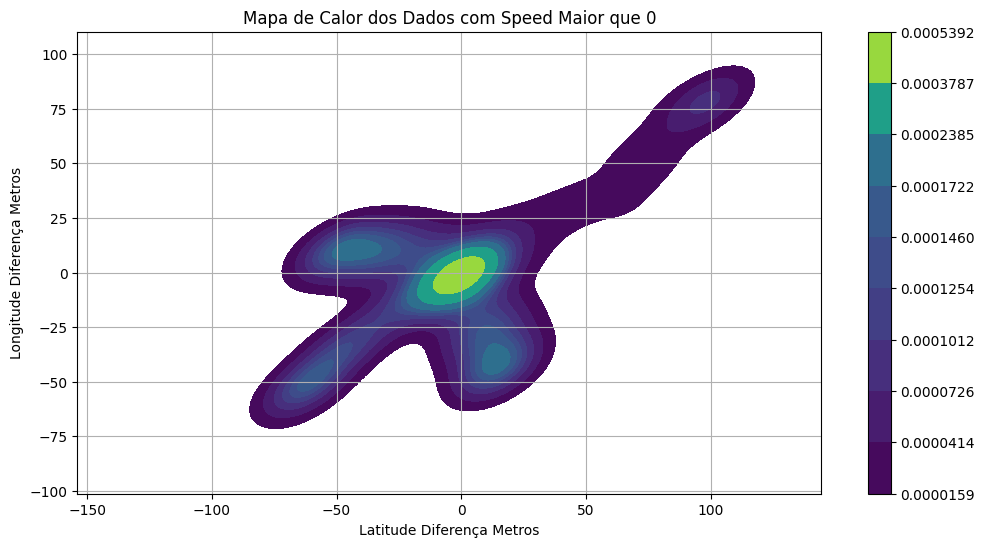

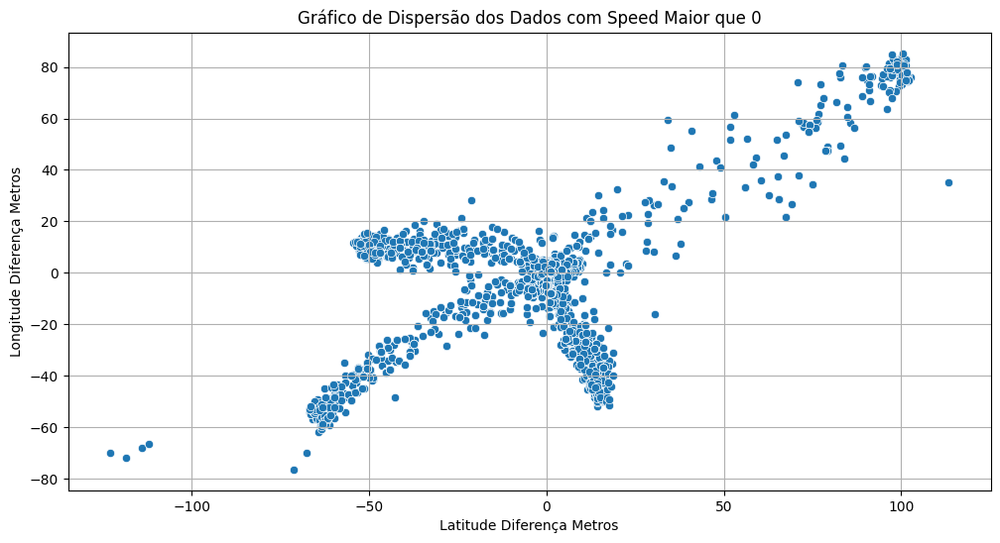

In [54]:
# Filtrar os dados onde o speed é maior que 0
dados_speed_maior_que_0 = df_concatenado[df_concatenado['gnss_data'].apply(lambda x: x['speed']) > 0]

# Plotar o mapa de calor dos dados com speed maior que 0
plt.figure(figsize=(12, 6))
sns.kdeplot(data=dados_speed_maior_que_0, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', cmap='viridis', fill=True, cbar=True)
plt.title('Mapa de Calor dos Dados com Speed Maior que 0')
plt.xlabel('Latitude Diferença Metros')
plt.ylabel('Longitude Diferença Metros')
plt.grid(True)
plt.show()

# Plotar o gráfico de dispersão dos dados com speed maior que 0
plt.figure(figsize=(12, 6))
sns.scatterplot(data=dados_speed_maior_que_0, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros')
plt.title('Gráfico de Dispersão dos Dados com Speed Maior que 0')
plt.xlabel('Latitude Diferença Metros')
plt.ylabel('Longitude Diferença Metros')
plt.grid(True)
plt.show()


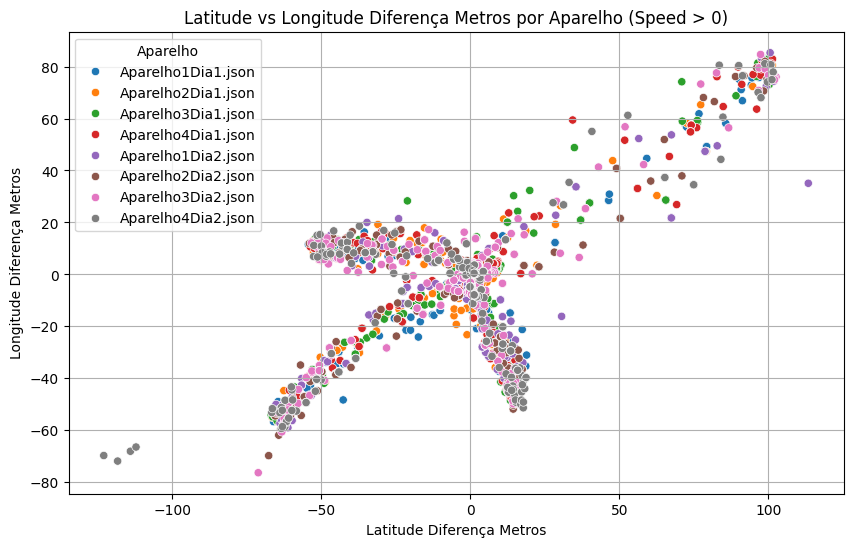

In [59]:
# Filtrar os dados para incluir apenas aqueles com speed maior que zero
dados_speed_maior_que_0 = df_concatenado[df_concatenado['gnss_data'].apply(lambda x: float(x['speed'])) > 0]

# Plotar latitude e longitude diferença metros por aparelho para speed > 0
plt.figure(figsize=(10, 6))
sns.scatterplot(data=dados_speed_maior_que_0, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros', hue='Arquivo')
plt.title('Latitude vs Longitude Diferença Metros por Aparelho (Speed > 0)')
plt.xlabel('Latitude Diferença Metros')
plt.ylabel('Longitude Diferença Metros')
plt.legend(title='Aparelho')
plt.grid(True)
plt.show()



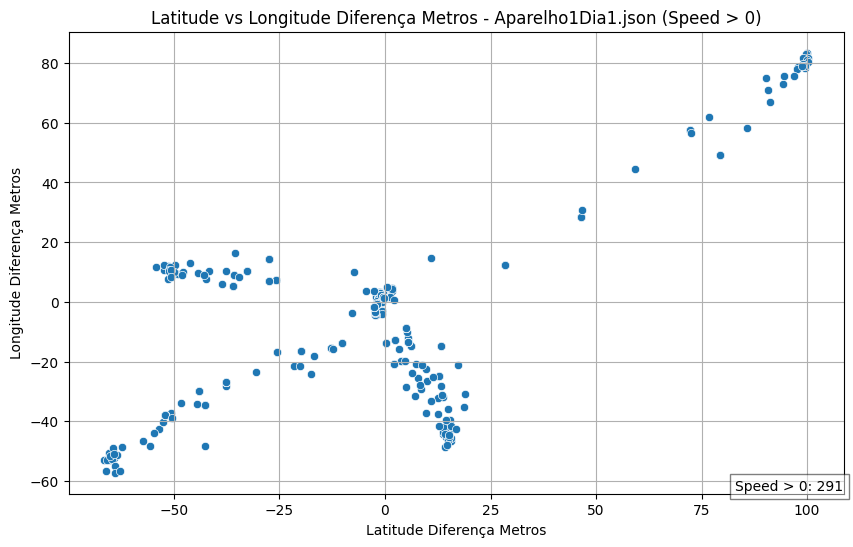

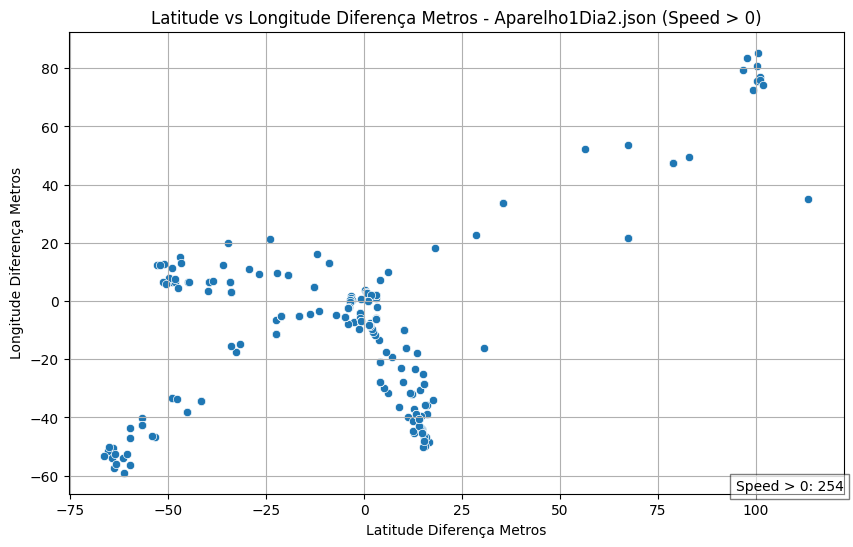

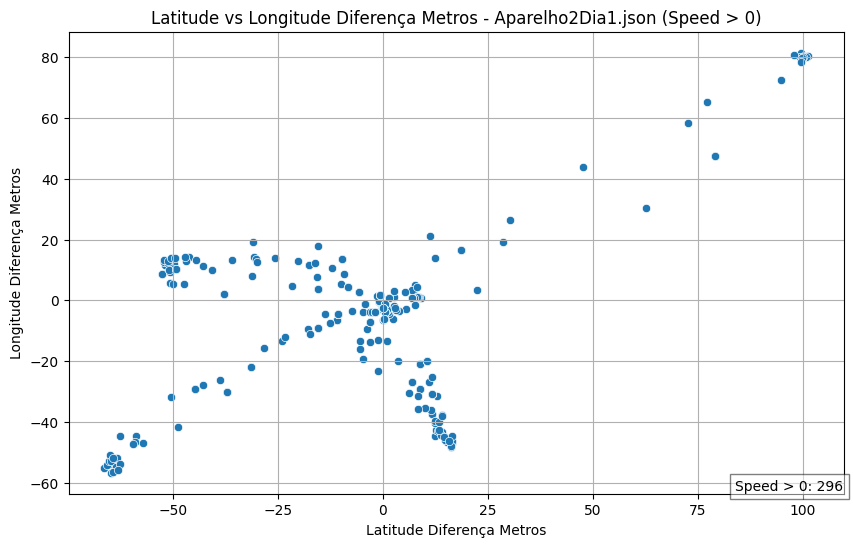

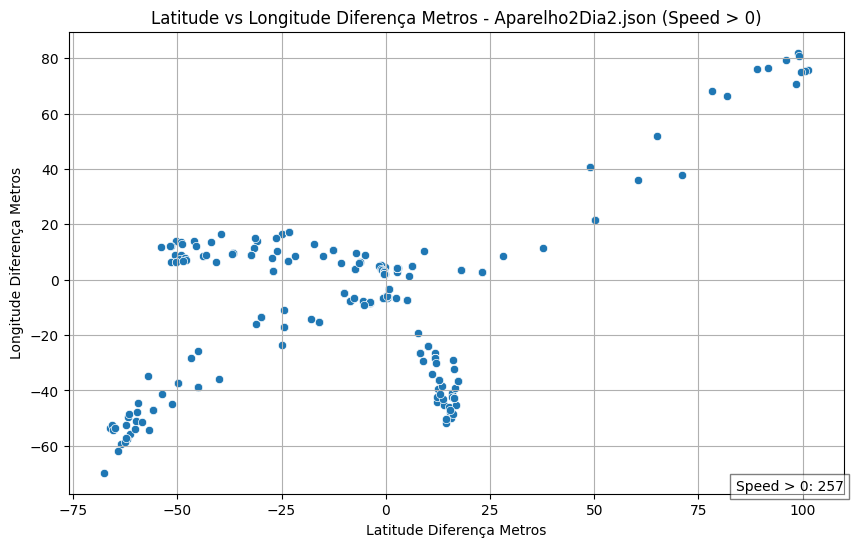

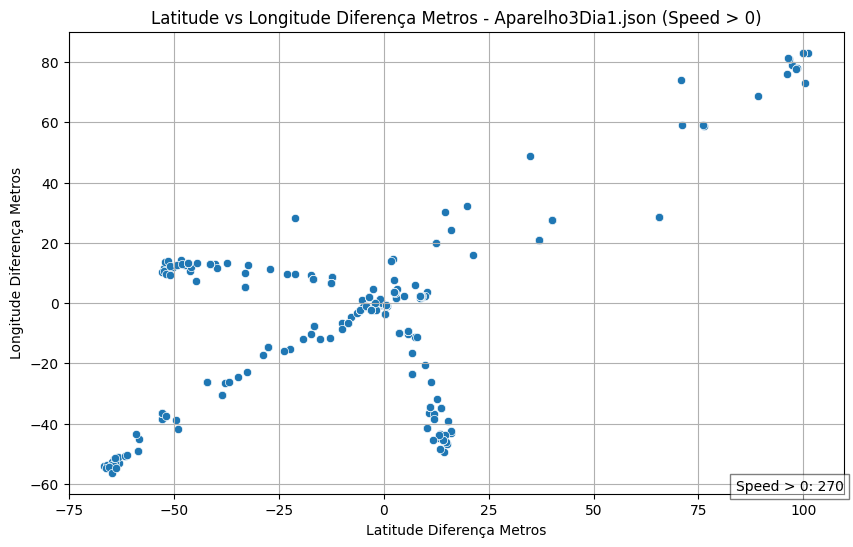

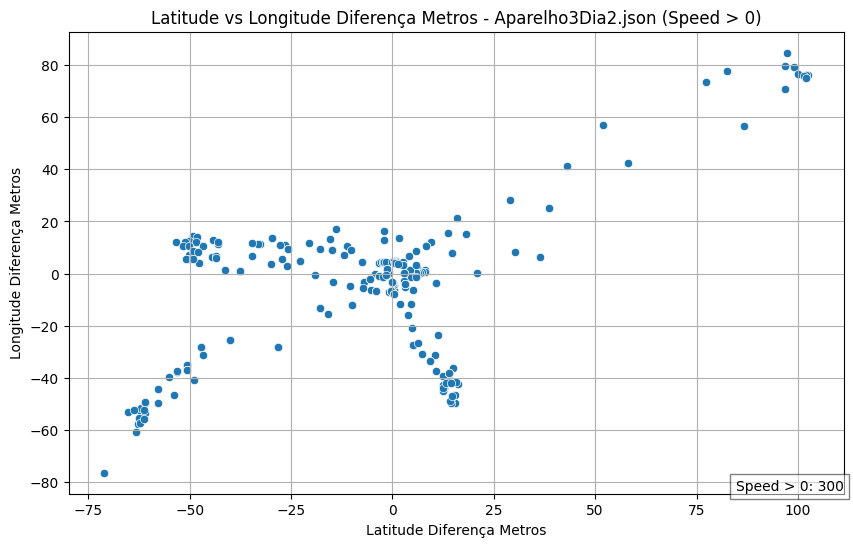

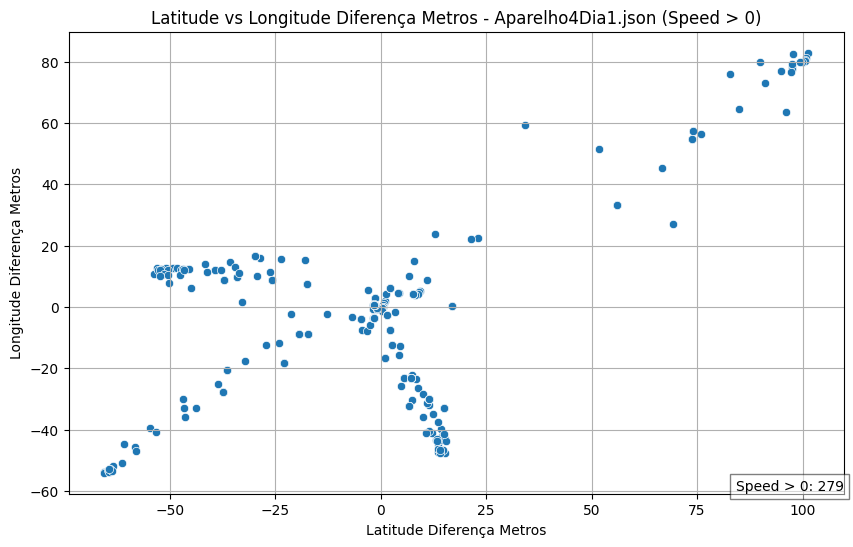

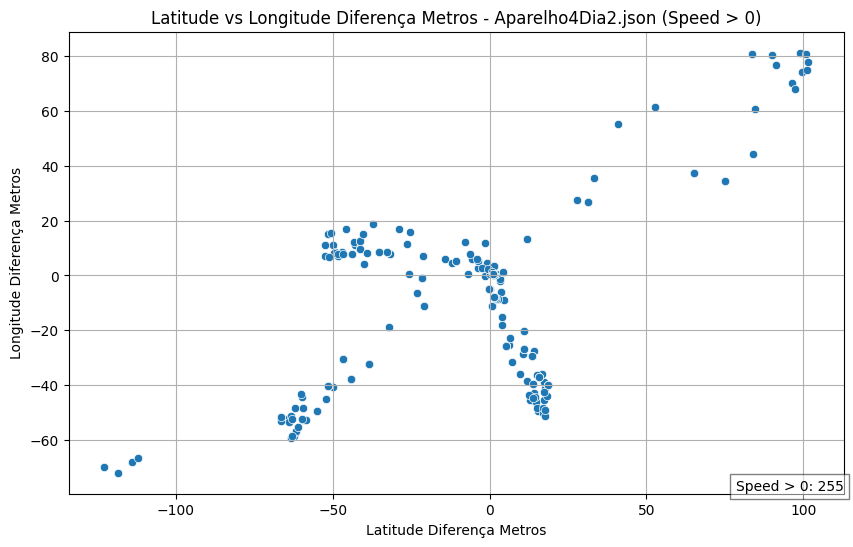

In [63]:
# Separar os dados por aparelho e por dia
grupos_por_aparelho_dia = dados_speed_maior_que_0.groupby('Arquivo')

for aparelho, dados_aparelho in grupos_por_aparelho_dia:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=dados_aparelho, x='latitudeDiferencaMetros', y='longitudeDiferencaMetros')
    plt.title(f'Latitude vs Longitude Diferença Metros - {aparelho} (Speed > 0)')
    plt.xlabel('Latitude Diferença Metros')
    plt.ylabel('Longitude Diferença Metros')
    plt.grid(True)
    
    # Contador de pontos
    contador = len(dados_aparelho)
    plt.text(plt.xlim()[1], plt.ylim()[0], f"Speed > 0: {contador}", verticalalignment='bottom', horizontalalignment='right', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))
    
    plt.show()


In [68]:
# Separar os dados em grupos com speed maior e menor/igual a zero
dados_speed_positivo = df_concatenado[df_concatenado['gnss_data'].apply(lambda x: x['speed']) > 0]
dados_speed_negativo = df_concatenado[df_concatenado['gnss_data'].apply(lambda x: x['speed']) <= 0]

# Calcular estatísticas descritivas
descritivas_speed_positivo = dados_speed_positivo[['latitudeDiferencaMetros', 'longitudeDiferencaMetros']].describe()
descritivas_speed_negativo = dados_speed_negativo[['latitudeDiferencaMetros', 'longitudeDiferencaMetros']].describe()
descritivas_total = df_concatenado[['latitudeDiferencaMetros', 'longitudeDiferencaMetros']].describe()

# Calcular teste t de Student para comparar os grupos
t_test_lat, p_value_lat = stats.ttest_ind(dados_speed_positivo['latitudeDiferencaMetros'], dados_speed_negativo['latitudeDiferencaMetros'], equal_var=False)
t_test_lon, p_value_lon = stats.ttest_ind(dados_speed_positivo['longitudeDiferencaMetros'], dados_speed_negativo['longitudeDiferencaMetros'], equal_var=False)

# Exibir os resultados
print("Estatísticas Descritivas - Dados com Speed > 0:")
print(descritivas_speed_positivo)
print("\nEstatísticas Descritivas - Dados com Speed <= 0:")
print(descritivas_speed_negativo)
print("\nEstatísticas Descritivas - Todos os Dados:")
print(descritivas_total)
print("\nTeste t de Student - Latitude:")
print("Estatística t:", t_test_lat)
print("Valor p:", p_value_lat)
print("\nTeste t de Student - Longitude:")
print("Estatística t:", t_test_lon)
print("Valor p:", p_value_lon)


Estatísticas Descritivas - Dados com Speed > 0:
       latitudeDiferencaMetros  longitudeDiferencaMetros
count              2202.000000               2202.000000
mean                 -5.480964                 -5.801378
std                  37.203647                 29.998283
min                -122.990380                -76.327836
25%                 -33.790768                -28.454688
50%                  -0.930129                 -2.590567
75%                  10.783158                  8.540212
max                 113.371714                 85.320534

Estatísticas Descritivas - Dados com Speed <= 0:
       latitudeDiferencaMetros  longitudeDiferencaMetros
count            207737.000000             207737.000000
mean                 -0.091380                 -2.495049
std                   4.797706                  4.371276
min                -119.656906                -70.890504
25%                  -1.142637                 -4.700415
50%                   0.085325                 

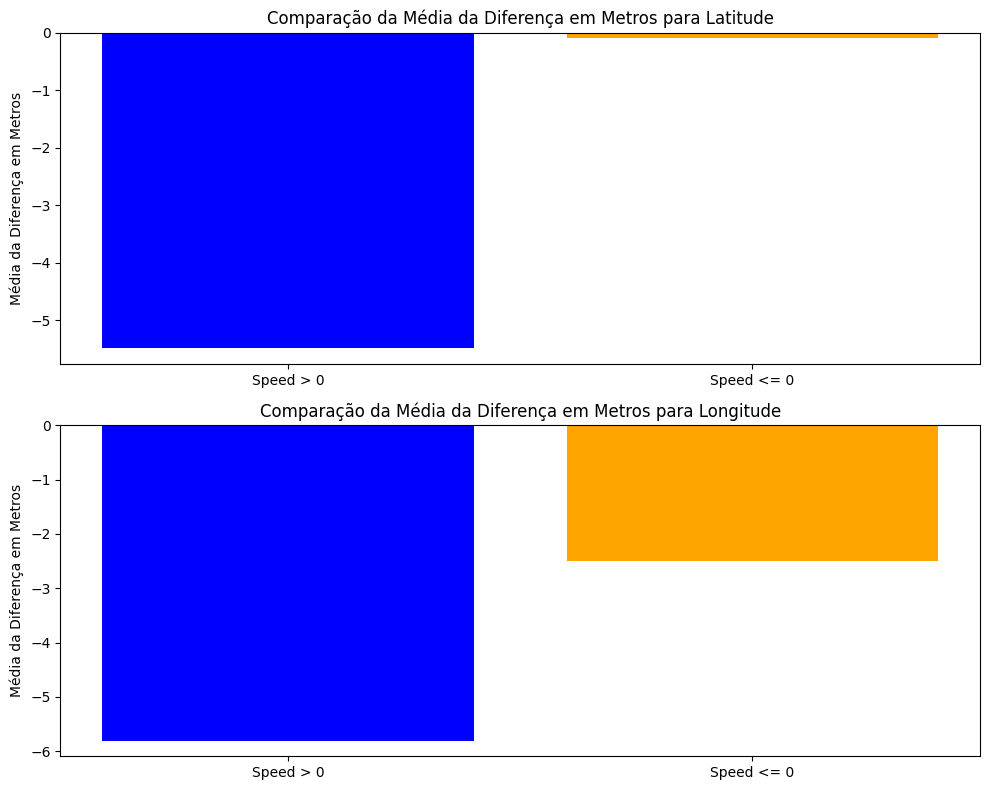


Teste t de Student:

Variável: Latitude
Estatística t: -6.797357481579282
Valor p: 1.3673042208180698e-11

Variável: Longitude
Estatística t: -5.171414939776446
Valor p: 2.533187936415323e-07


In [70]:
# Médias da diferença em metros para latitude e longitude
medias_lat = [descritivas_speed_positivo.loc['mean', 'latitudeDiferencaMetros'],
              descritivas_speed_negativo.loc['mean', 'latitudeDiferencaMetros']]
medias_lon = [descritivas_speed_positivo.loc['mean', 'longitudeDiferencaMetros'],
              descritivas_speed_negativo.loc['mean', 'longitudeDiferencaMetros']]

# Teste t de Student
t_tests = [t_test_lat, t_test_lon]
p_values = [p_value_lat, p_value_lon]

# Gráfico de barras
fig, ax = plt.subplots(2, 1, figsize=(10, 8))

# Latitude
ax[0].bar(['Speed > 0', 'Speed <= 0'], medias_lat, color=['blue', 'orange'])
ax[0].set_title('Comparação da Média da Diferença em Metros para Latitude')
ax[0].set_ylabel('Média da Diferença em Metros')

# Longitude
ax[1].bar(['Speed > 0', 'Speed <= 0'], medias_lon, color=['blue', 'orange'])
ax[1].set_title('Comparação da Média da Diferença em Metros para Longitude')
ax[1].set_ylabel('Média da Diferença em Metros')

plt.tight_layout()
plt.show()

# Resultados do teste t de Student
print("\nTeste t de Student:")
for i, var in enumerate(['Latitude', 'Longitude']):
    print(f"\nVariável: {var}")
    print("Estatística t:", t_tests[i])
    print("Valor p:", p_values[i])


In [86]:
# Definir os intervalos de diferença em metros
intervalos = [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (6, 7), (7, 8), (8, 9),(9, 10),(10, 11),(11, 12),(12, 13),(13, 14),(14, 15),(15, 16),(16, 17),(17, 18),(18, 19),(19, 20), (20, float('inf'))]

# Iterar sobre os intervalos
for intervalo in intervalos:
    # Filtrar os dados dentro do intervalo de diferença em metros
    dados_intervalo = df_concatenado[((df_concatenado['latitudeDiferencaMetros'] - df_concatenado['longitudeDiferencaMetros']).abs() >= intervalo[0]) & ((df_concatenado['latitudeDiferencaMetros'] - df_concatenado['longitudeDiferencaMetros']).abs() < intervalo[1])]
    
    # Calcular as estatísticas descritivas para cada atributo
    media_speed = dados_intervalo['gnss_data'].apply(lambda x: x['speed']).mean()
    desvio_padrao_speed = dados_intervalo['gnss_data'].apply(lambda x: x['speed']).std()
    media_altitude = dados_intervalo['gnss_data'].apply(lambda x: x['altitude']).mean()
    desvio_padrao_altitude = dados_intervalo['gnss_data'].apply(lambda x: x['altitude']).std()
    media_accuracy = dados_intervalo['gnss_data'].apply(lambda x: x['accuracy']).mean()
    desvio_padrao_accuracy = dados_intervalo['gnss_data'].apply(lambda x: x['accuracy']).std()
    media_bearing = dados_intervalo['gnss_data'].apply(lambda x: x['bearing']).mean()
    desvio_padrao_bearing = dados_intervalo['gnss_data'].apply(lambda x: x['bearing']).std()
    
    # Imprimir as estatísticas descritivas para cada atributo
    print(f'Intervalo de Diferença em Metros: {intervalo[0]} - {intervalo[1]} metros')
    print("Média de 'speed':", media_speed)
    print("Desvio padrão de 'speed':", desvio_padrao_speed)
    print("Média de 'altitude':", media_altitude)
    print("Desvio padrão de 'altitude':", desvio_padrao_altitude)
    print("Média de 'accuracy':", media_accuracy)
    print("Desvio padrão de 'accuracy':", desvio_padrao_accuracy)
    print("Média de 'bearing':", media_bearing)
    print("Desvio padrão de 'bearing':", desvio_padrao_bearing)
    print('\n')



Intervalo de Diferença em Metros: 0 - 1 metros
Média de 'speed': 0.00024005972947333874
Desvio padrão de 'speed': 0.010279303809878073
Média de 'altitude': 448.87440068656423
Desvio padrão de 'altitude': 3.6990168782650517
Média de 'accuracy': 1.0489291612124596
Desvio padrão de 'accuracy': 0.08757185852093007
Média de 'bearing': 176.9347880002938
Desvio padrão de 'bearing': 98.52563285076705


Intervalo de Diferença em Metros: 1 - 2 metros
Média de 'speed': 0.00027085999898512886
Desvio padrão de 'speed': 0.010237758009046711
Média de 'altitude': 448.2450257113473
Desvio padrão de 'altitude': 3.064852740556724
Média de 'accuracy': 1.049582915782329
Desvio padrão de 'accuracy': 0.08479234374661061
Média de 'bearing': 186.72224018548968
Desvio padrão de 'bearing': 102.29837625987076


Intervalo de Diferença em Metros: 2 - 3 metros
Média de 'speed': 0.00034983758372729526
Desvio padrão de 'speed': 0.008922684154983374
Média de 'altitude': 447.82818953869906
Desvio padrão de 'altitude': 4

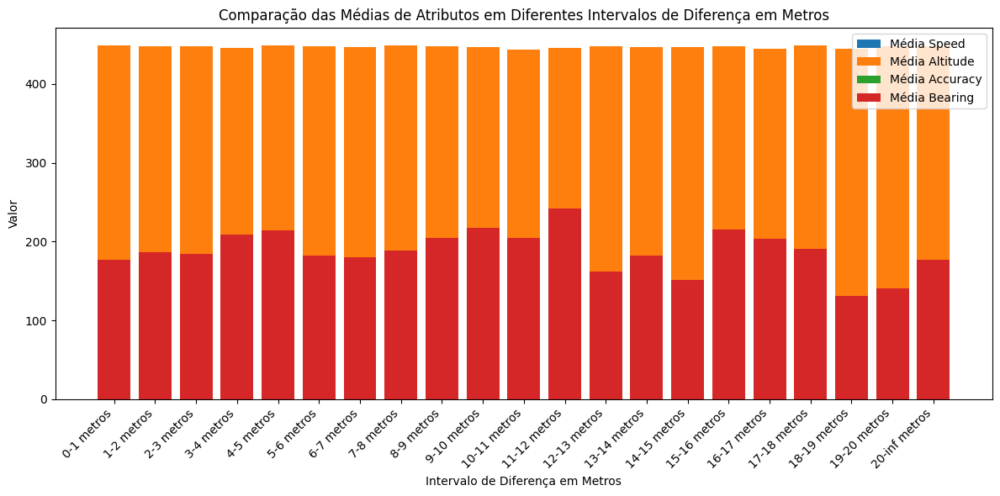

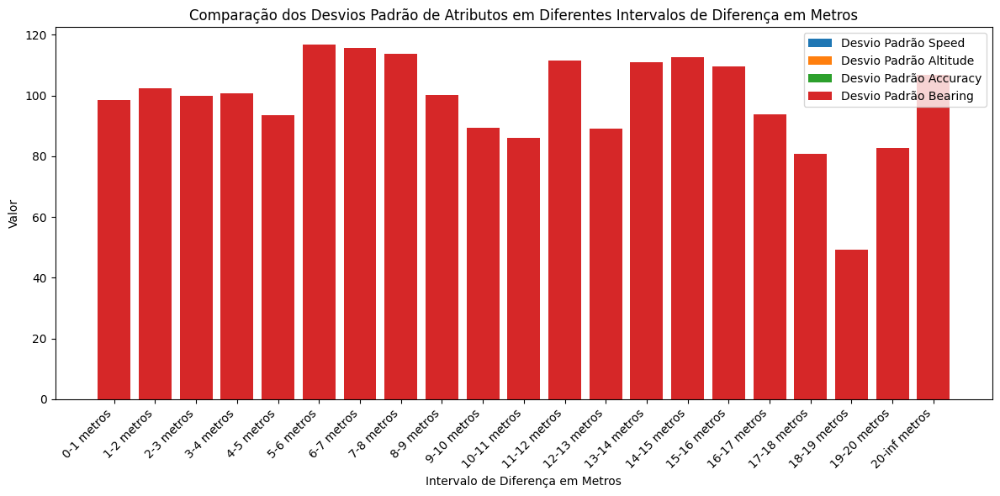

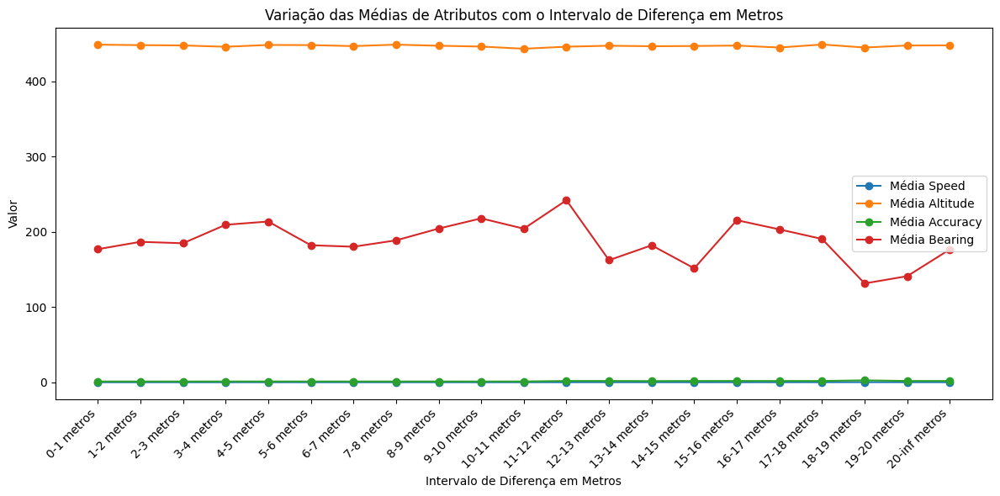

In [87]:
# Listas para armazenar as estatísticas calculadas
intervalos_labels = [f'{intervalo[0]}-{intervalo[1]} metros' for intervalo in intervalos]
medias_speed = []
desvios_padrao_speed = []
medias_altitude = []
desvios_padrao_altitude = []
medias_accuracy = []
desvios_padrao_accuracy = []
medias_bearing = []
desvios_padrao_bearing = []

# Iterar sobre os intervalos
for intervalo in intervalos:
    # Filtrar os dados dentro do intervalo de diferença em metros
    dados_intervalo = df_concatenado[((df_concatenado['latitudeDiferencaMetros'] - df_concatenado['longitudeDiferencaMetros']).abs() >= intervalo[0]) & ((df_concatenado['latitudeDiferencaMetros'] - df_concatenado['longitudeDiferencaMetros']).abs() < intervalo[1])]
    
    # Calcular as estatísticas descritivas para cada atributo
    media_speed = dados_intervalo['gnss_data'].apply(lambda x: x['speed']).mean()
    desvio_padrao_speed = dados_intervalo['gnss_data'].apply(lambda x: x['speed']).std()
    media_altitude = dados_intervalo['gnss_data'].apply(lambda x: x['altitude']).mean()
    desvio_padrao_altitude = dados_intervalo['gnss_data'].apply(lambda x: x['altitude']).std()
    media_accuracy = dados_intervalo['gnss_data'].apply(lambda x: x['accuracy']).mean()
    desvio_padrao_accuracy = dados_intervalo['gnss_data'].apply(lambda x: x['accuracy']).std()
    media_bearing = dados_intervalo['gnss_data'].apply(lambda x: x['bearing']).mean()
    desvio_padrao_bearing = dados_intervalo['gnss_data'].apply(lambda x: x['bearing']).std()
    
    # Armazenar as estatísticas calculadas
    medias_speed.append(media_speed)
    desvios_padrao_speed.append(desvio_padrao_speed)
    medias_altitude.append(media_altitude)
    desvios_padrao_altitude.append(desvio_padrao_altitude)
    medias_accuracy.append(media_accuracy)
    desvios_padrao_accuracy.append(desvio_padrao_accuracy)
    medias_bearing.append(media_bearing)
    desvios_padrao_bearing.append(desvio_padrao_bearing)

# Gráfico de barras para comparar as médias de 'speed', 'altitude', 'accuracy' e 'bearing' em diferentes intervalos de diferença em metros
plt.figure(figsize=(12, 6))
plt.bar(intervalos_labels, medias_speed, label='Média Speed')
plt.bar(intervalos_labels, medias_altitude, label='Média Altitude')
plt.bar(intervalos_labels, medias_accuracy, label='Média Accuracy')
plt.bar(intervalos_labels, medias_bearing, label='Média Bearing')
plt.xlabel('Intervalo de Diferença em Metros')
plt.ylabel('Valor')
plt.title('Comparação das Médias de Atributos em Diferentes Intervalos de Diferença em Metros')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Gráfico de barras para comparar os desvios padrão de 'speed', 'altitude', 'accuracy' e 'bearing' em diferentes intervalos de diferença em metros
plt.figure(figsize=(12, 6))
plt.bar(intervalos_labels, desvios_padrao_speed, label='Desvio Padrão Speed')
plt.bar(intervalos_labels, desvios_padrao_altitude, label='Desvio Padrão Altitude')
plt.bar(intervalos_labels, desvios_padrao_accuracy, label='Desvio Padrão Accuracy')
plt.bar(intervalos_labels, desvios_padrao_bearing, label='Desvio Padrão Bearing')
plt.xlabel('Intervalo de Diferença em Metros')
plt.ylabel('Valor')
plt.title('Comparação dos Desvios Padrão de Atributos em Diferentes Intervalos de Diferença em Metros')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Gráfico de linha para mostrar como as médias de 'speed', 'altitude', 'accuracy' e 'bearing' variam com o intervalo de diferença em metros
plt.figure(figsize=(12, 6))
plt.plot(intervalos_labels, medias_speed, marker='o', label='Média Speed')
plt.plot(intervalos_labels, medias_altitude, marker='o', label='Média Altitude')
plt.plot(intervalos_labels, medias_accuracy, marker='o', label='Média Accuracy')
plt.plot(intervalos_labels, medias_bearing, marker='o', label='Média Bearing')
plt.xlabel('Intervalo de Diferença em Metros')
plt.ylabel('Valor')
plt.title('Variação das Médias de Atributos com o Intervalo de Diferença em Metros')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


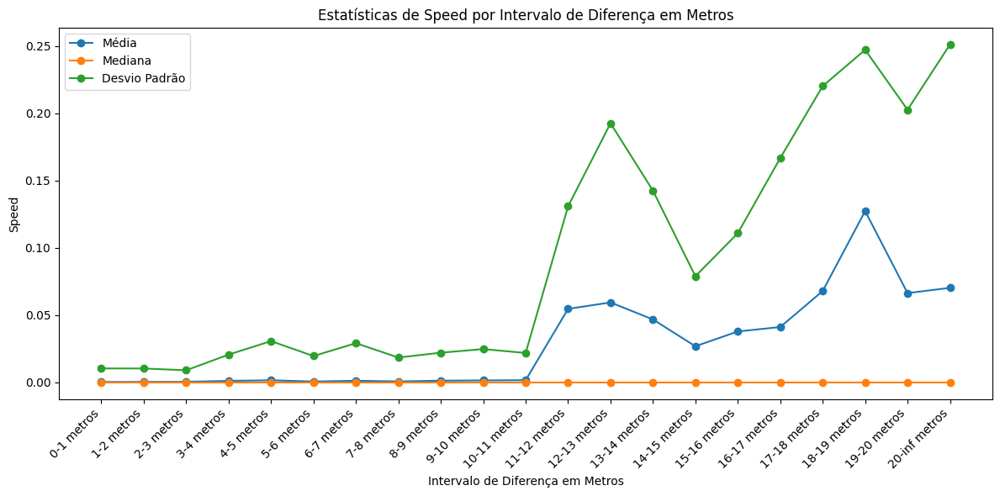

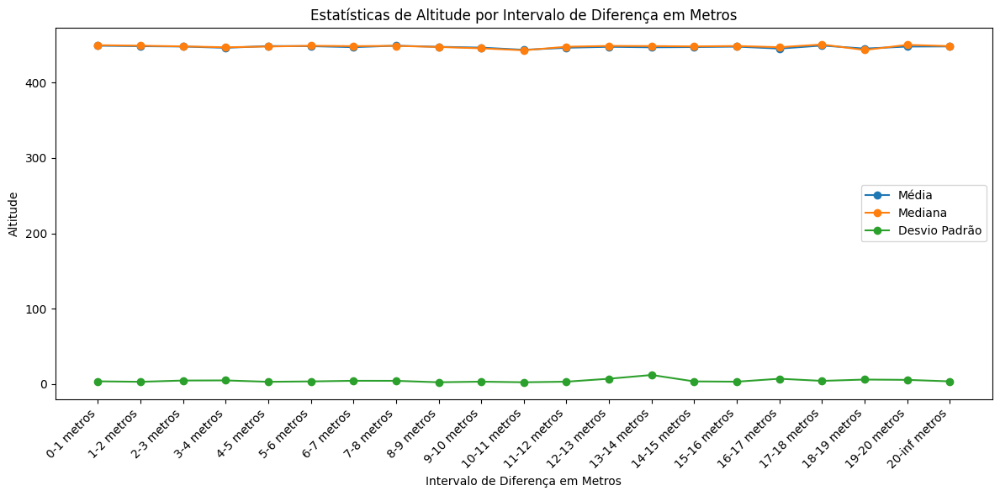

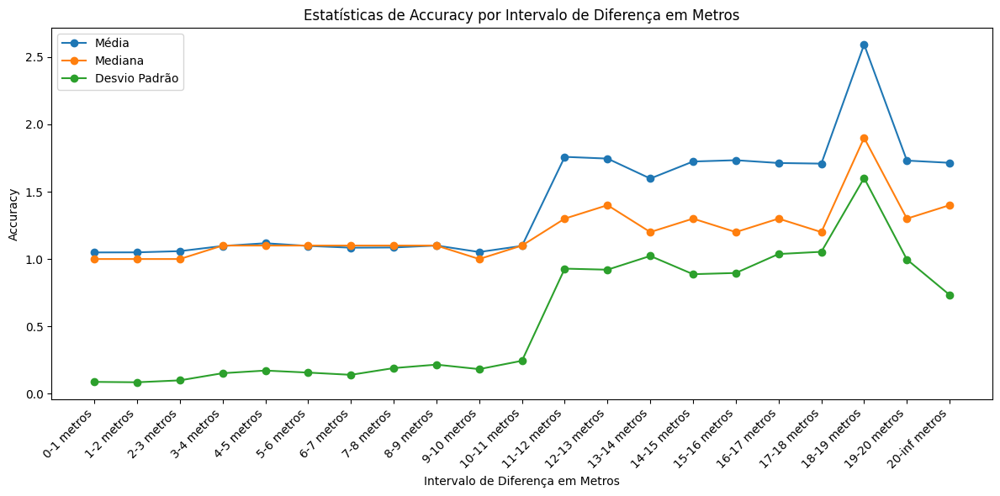

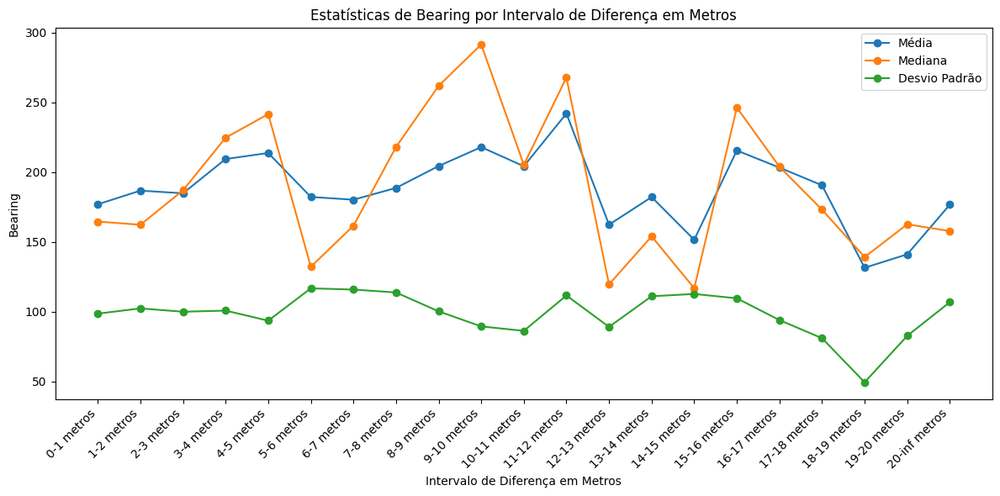

In [88]:
# Função para calcular estatísticas
def calcular_estatisticas(dados):
    estatisticas = {
        'Média': dados.mean(),
        'Mediana': dados.median(),
        #'Mínimo': dados.min(),
        #'Máximo': dados.max(),
        'Desvio Padrão': dados.std()
    }
    return estatisticas

# Lista de atributos
atributos = ['speed', 'altitude', 'accuracy', 'bearing']

# Iterar sobre os atributos
for atributo in atributos:
    # Listas para armazenar as estatísticas calculadas para cada intervalo de diferença em metros
    estatisticas_por_intervalo = []
    
    # Iterar sobre os intervalos
    for intervalo in intervalos:
        # Filtrar os dados dentro do intervalo de diferença em metros
        dados_intervalo = df_concatenado[((df_concatenado['latitudeDiferencaMetros'] - df_concatenado['longitudeDiferencaMetros']).abs() >= intervalo[0]) & ((df_concatenado['latitudeDiferencaMetros'] - df_concatenado['longitudeDiferencaMetros']).abs() < intervalo[1])]
        
        # Calcular estatísticas descritivas para o atributo dentro do intervalo
        estatisticas = calcular_estatisticas(dados_intervalo['gnss_data'].apply(lambda x: x[atributo]))
        
        # Armazenar estatísticas calculadas
        estatisticas_por_intervalo.append(estatisticas)

    # Gerar gráfico para o atributo atual
    plt.figure(figsize=(12, 6))
    for chave, valor in estatisticas_por_intervalo[0].items():
        plt.plot(intervalos_labels, [estatisticas[chave] for estatisticas in estatisticas_por_intervalo], marker='o', label=chave)
    plt.xlabel('Intervalo de Diferença em Metros')
    plt.ylabel(atributo.capitalize())
    plt.title(f'Estatísticas de {atributo.capitalize()} por Intervalo de Diferença em Metros')
    plt.legend()
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


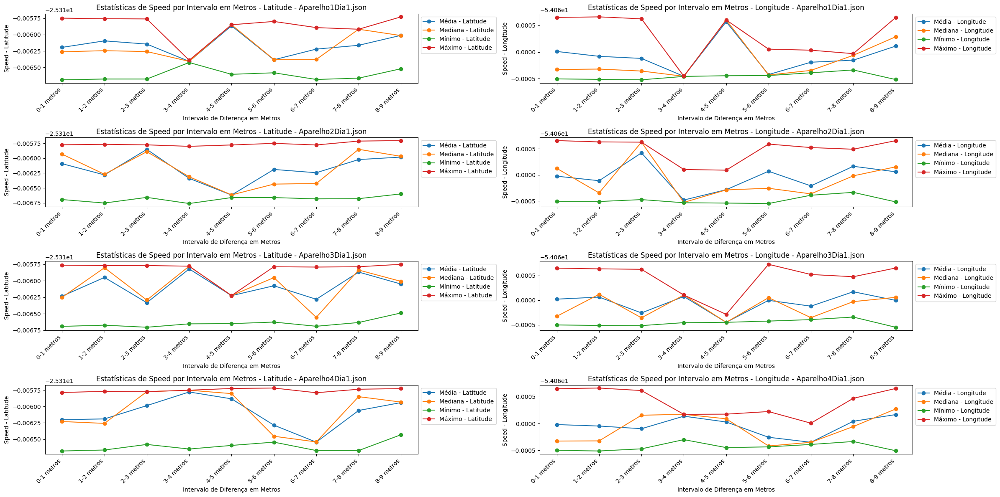

C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


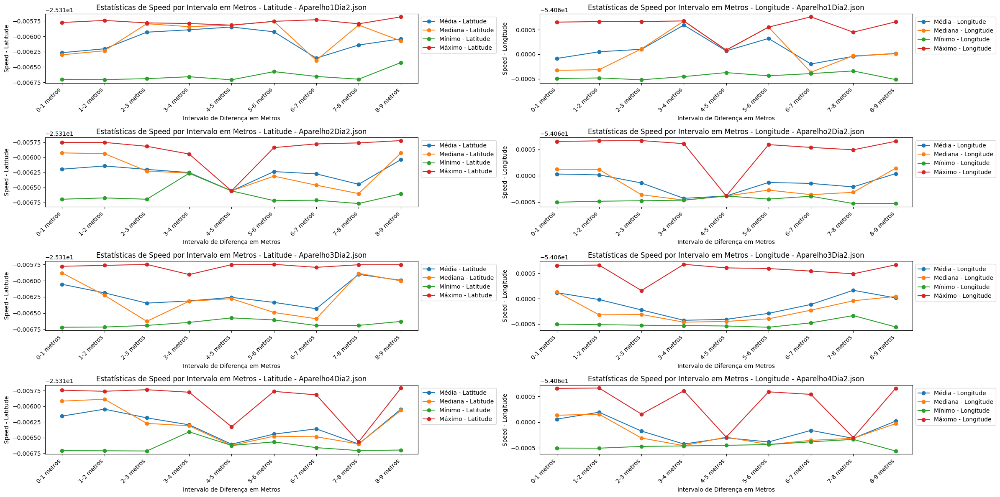

C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


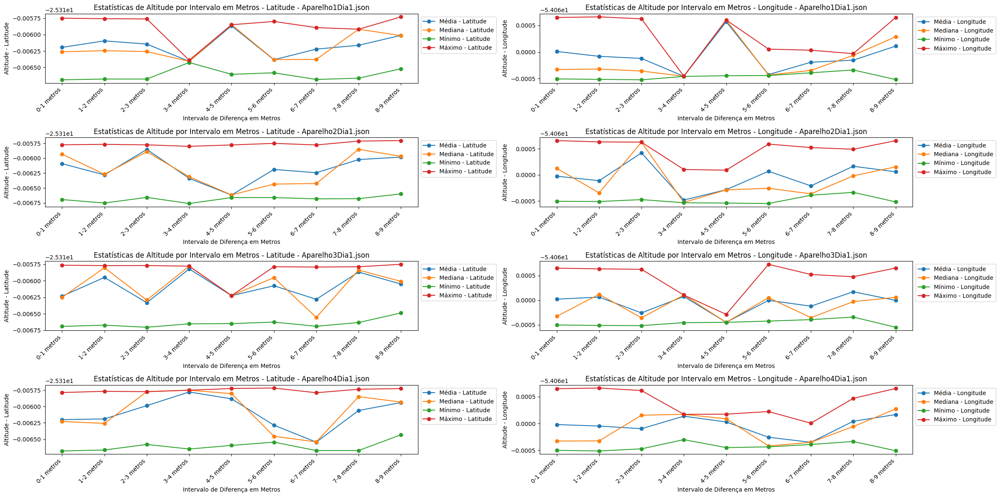

C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


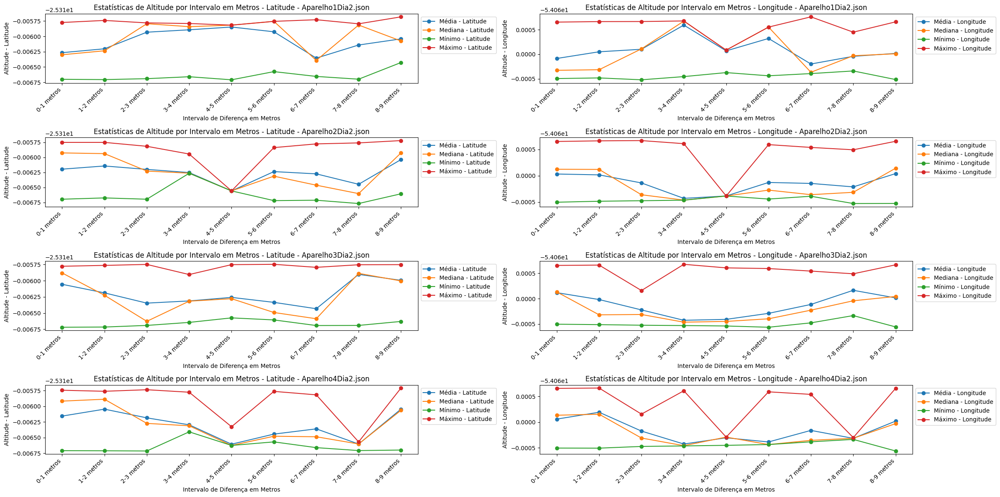

C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


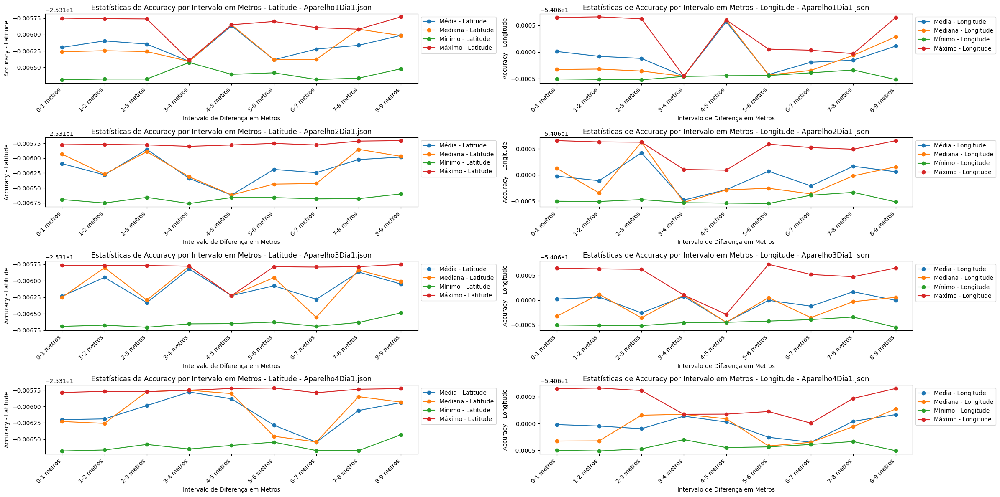

C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


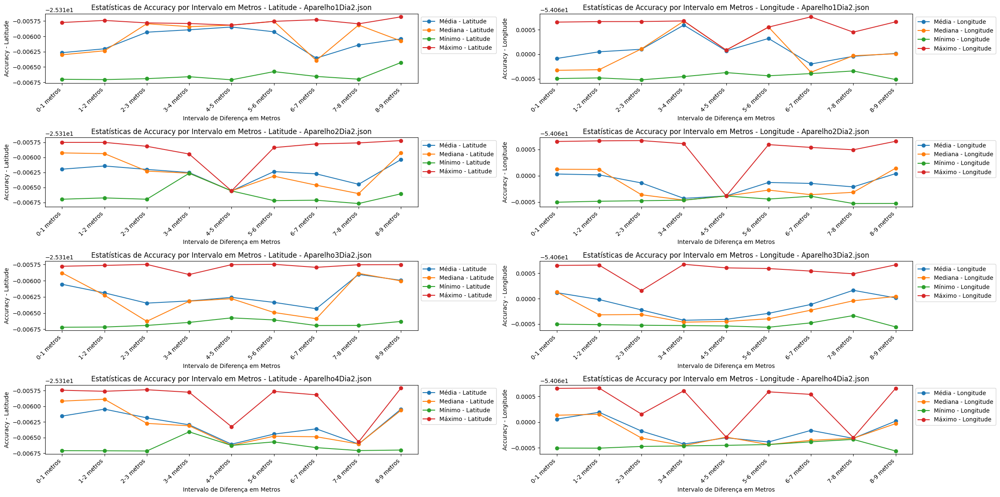

C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


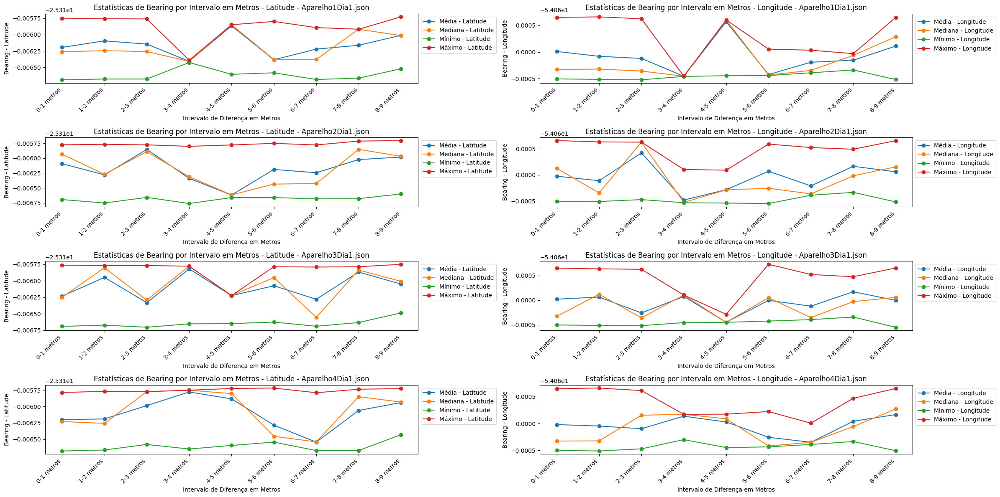

C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:62: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\bruno\AppData\Local\Temp\ipykernel_19336\286047476.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


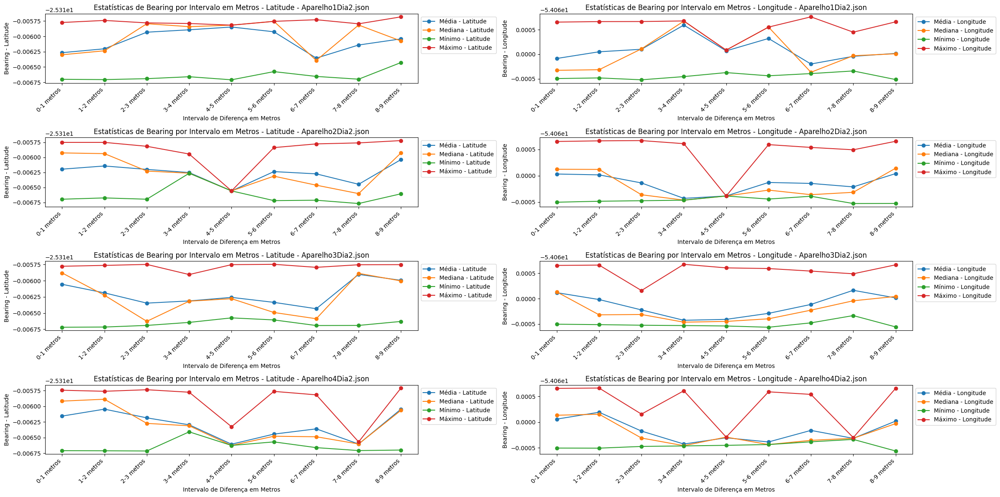

In [117]:
# Função para calcular estatísticas
def calcular_estatisticas(dados):
    estatisticas = {
        'Média': dados.mean(),
        'Mediana': dados.median(),
        'Mínimo': dados.min(),
        'Máximo': dados.max(),
        #'Desvio Padrão': dados.std()
    }
    return estatisticas

# Lista de atributos
atributos = ['speed', 'altitude', 'accuracy', 'bearing']

# Número máximo de gráficos por imagem
max_graficos_por_imagem = 4

# Iterar sobre os atributos
for atributo in atributos:
    # Lista de aparelhos que têm dados para o atributo atual
    aparelhos_com_dados = df_concatenado[df_concatenado['gnss_data'].apply(lambda x: x.get(atributo) is not None)]['Arquivo'].unique()
    
    # Dividir os aparelhos em grupos de acordo com o número máximo de gráficos por imagem
    grupos_aparelhos = [aparelhos_com_dados[i:i+max_graficos_por_imagem] for i in range(0, len(aparelhos_com_dados), max_graficos_por_imagem)]
    
    # Iterar sobre os grupos de aparelhos
    for i, grupo_aparelhos in enumerate(grupos_aparelhos):
        # Criar figura para os gráficos
        plt.figure(figsize=(24, 12))
        
        # Iterar sobre os aparelhos no grupo atual
        for j, aparelho in enumerate(grupo_aparelhos):
            # Filtrar os dados pelo aparelho atual e pelo atributo atual
            dados_aparelho = df_concatenado[(df_concatenado['Arquivo'] == aparelho) & df_concatenado['gnss_data'].apply(lambda x: x.get(atributo) is not None)]
            
            # Listas para armazenar as estatísticas calculadas para cada intervalo de diferença em metros
            estatisticas_por_intervalo_lat = []
            estatisticas_por_intervalo_lon = []
            
            # Iterar sobre os intervalos
            for intervalo in intervalos:
                # Filtrar os dados dentro do intervalo de diferença em metros
                dados_intervalo = dados_aparelho[(dados_aparelho['latitudeDiferencaMetros'].abs() >= intervalo[0]) & (dados_aparelho['latitudeDiferencaMetros'].abs() < intervalo[1])]
                
                # Calcular estatísticas descritivas para a latitude dentro do intervalo
                estatisticas_lat = calcular_estatisticas(dados_intervalo['gnss_data'].apply(lambda x: x['latitude']))
                estatisticas_por_intervalo_lat.append(estatisticas_lat)
                
                # Calcular estatísticas descritivas para a longitude dentro do intervalo
                estatisticas_lon = calcular_estatisticas(dados_intervalo['gnss_data'].apply(lambda x: x['longitude']))
                estatisticas_por_intervalo_lon.append(estatisticas_lon)

            # Plotar gráficos para o aparelho atual
            plt.subplot(max_graficos_por_imagem, 2, 2*j+1)
            for chave, valor in estatisticas_por_intervalo_lat[0].items():
                plt.plot(intervalos_labels[:len(estatisticas_por_intervalo_lat)], [estatisticas[chave] for estatisticas in estatisticas_por_intervalo_lat], marker='o', label=f'{chave} - Latitude')
            plt.xlabel('Intervalo de Diferença em Metros')
            plt.ylabel(f'{atributo.capitalize()} - Latitude')
            plt.title(f'Estatísticas de {atributo.capitalize()} por Intervalo em Metros - Latitude - {aparelho}')
            plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()

            plt.subplot(max_graficos_por_imagem, 2, 2*j+2)
            for chave, valor in estatisticas_por_intervalo_lon[0].items():
                plt.plot(intervalos_labels[:len(estatisticas_por_intervalo_lon)], [estatisticas[chave] for estatisticas in estatisticas_por_intervalo_lon], marker='o', label=f'{chave} - Longitude')
            plt.xlabel('Intervalo de Diferença em Metros')
            plt.ylabel(f'{atributo.capitalize()} - Longitude')
            plt.title(f'Estatísticas de {atributo.capitalize()} por Intervalo em Metros - Longitude - {aparelho}')
            plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()

        plt.show()


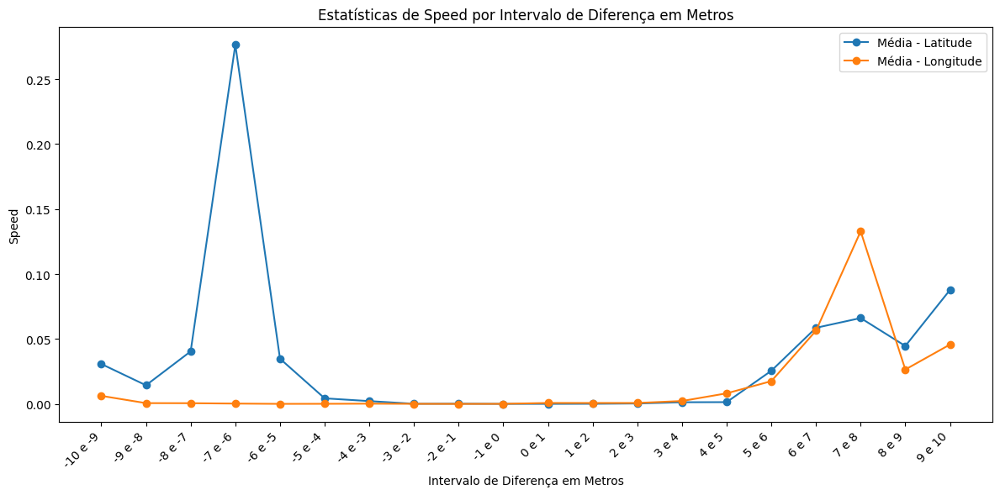

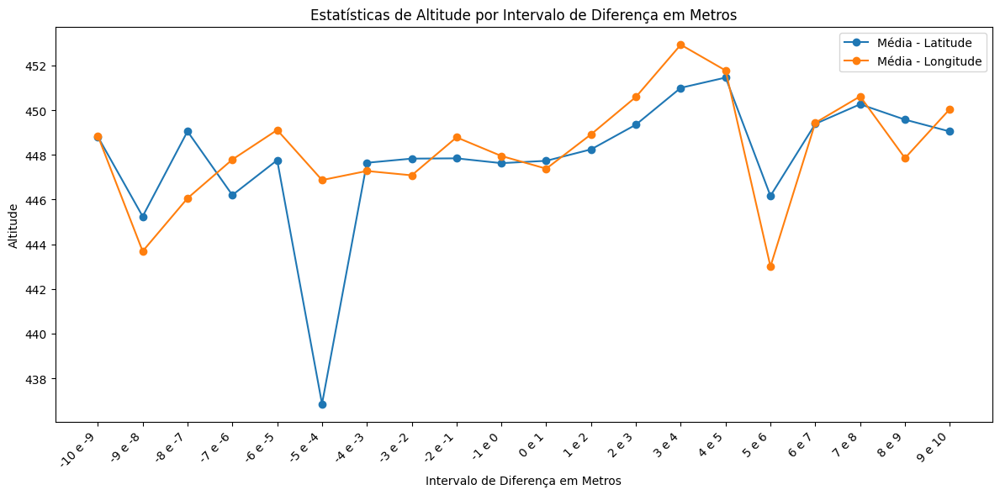

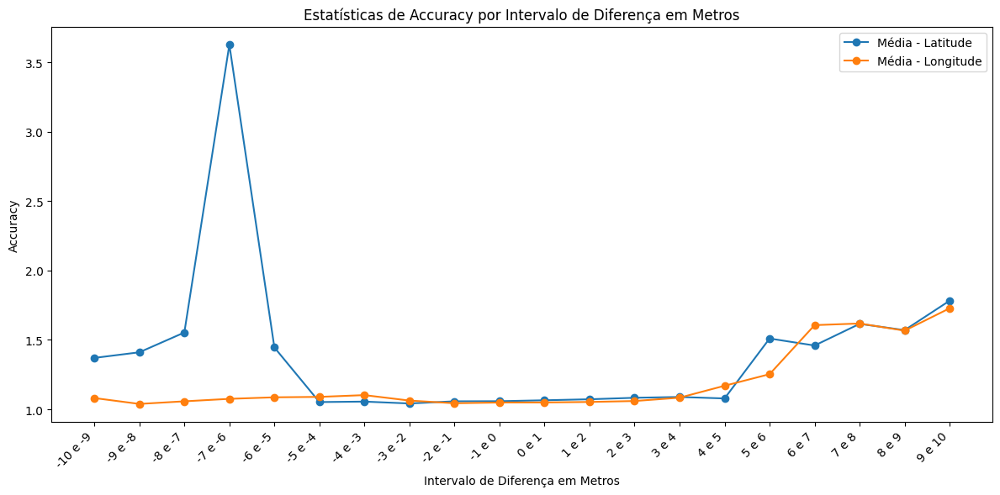

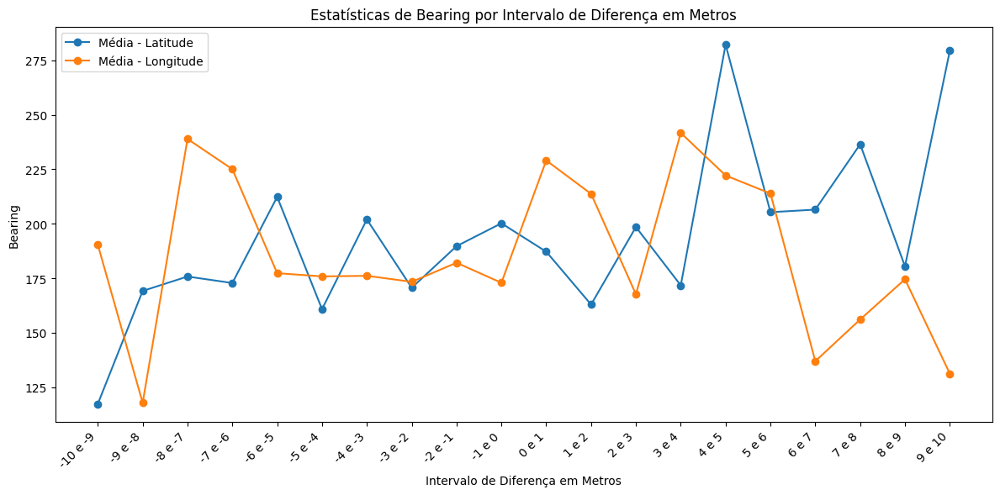

In [135]:
# Função para calcular estatísticas
def calcular_estatisticas(dados):
    estatisticas = {
        'Média': dados.mean(),
        #'Mediana': dados.median(),
        #'Desvio Padrão': dados.std()
    }
    return estatisticas

# Lista de atributos
atributos = ['speed', 'altitude', 'accuracy', 'bearing']

# Intervalos de diferença em metros
intervalos = [(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0), (0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (6, 7), (7, 8), (8, 9), (9, 10)]

# Labels dos intervalos
intervalos_labels = [f'{intervalo[0]} e {intervalo[1]}' for intervalo in intervalos]

# Iterar sobre os atributos
for atributo in atributos:
    # Listas para armazenar as estatísticas calculadas para cada intervalo de diferença em metros
    estatisticas_por_intervalo = {'latitude': [], 'longitude': []}
    
    # Iterar sobre os intervalos
    for intervalo in intervalos:
        # Filtrar os dados dentro do intervalo de diferença em metros para latitude
        dados_intervalo_lat = df_concatenado[(df_concatenado['latitudeDiferencaMetros'] >= intervalo[0]) & (df_concatenado['latitudeDiferencaMetros'] < intervalo[1])]
        # Filtrar os dados dentro do intervalo de diferença em metros para longitude
        dados_intervalo_lon = df_concatenado[(df_concatenado['longitudeDiferencaMetros'] >= intervalo[0]) & (df_concatenado['longitudeDiferencaMetros'] < intervalo[1])]
        
        # Calcular estatísticas descritivas para latitude dentro do intervalo
        estatisticas_lat = calcular_estatisticas(dados_intervalo_lat['gnss_data'].apply(lambda x: x[atributo]))
        estatisticas_por_intervalo['latitude'].append(estatisticas_lat)
        
        # Calcular estatísticas descritivas para longitude dentro do intervalo
        estatisticas_lon = calcular_estatisticas(dados_intervalo_lon['gnss_data'].apply(lambda x: x[atributo]))
        estatisticas_por_intervalo['longitude'].append(estatisticas_lon)

    # Gerar gráfico para latitude e longitude
    plt.figure(figsize=(12, 6))
    
    # Plotar médias de latitude
    for chave, valor in estatisticas_por_intervalo['latitude'][0].items():
        plt.plot(intervalos_labels, [estatisticas[chave] for estatisticas in estatisticas_por_intervalo['latitude']], marker='o', label=f'{chave} - Latitude')
    
    # Plotar médias de longitude
    for chave, valor in estatisticas_por_intervalo['longitude'][0].items():
        plt.plot(intervalos_labels, [estatisticas[chave] for estatisticas in estatisticas_por_intervalo['longitude']], marker='o', label=f'{chave} - Longitude')
    
    plt.xlabel('Intervalo de Diferença em Metros')
    plt.ylabel(atributo.capitalize())
    plt.title(f'Estatísticas de {atributo.capitalize()} por Intervalo de Diferença em Metros')
    plt.legend()
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


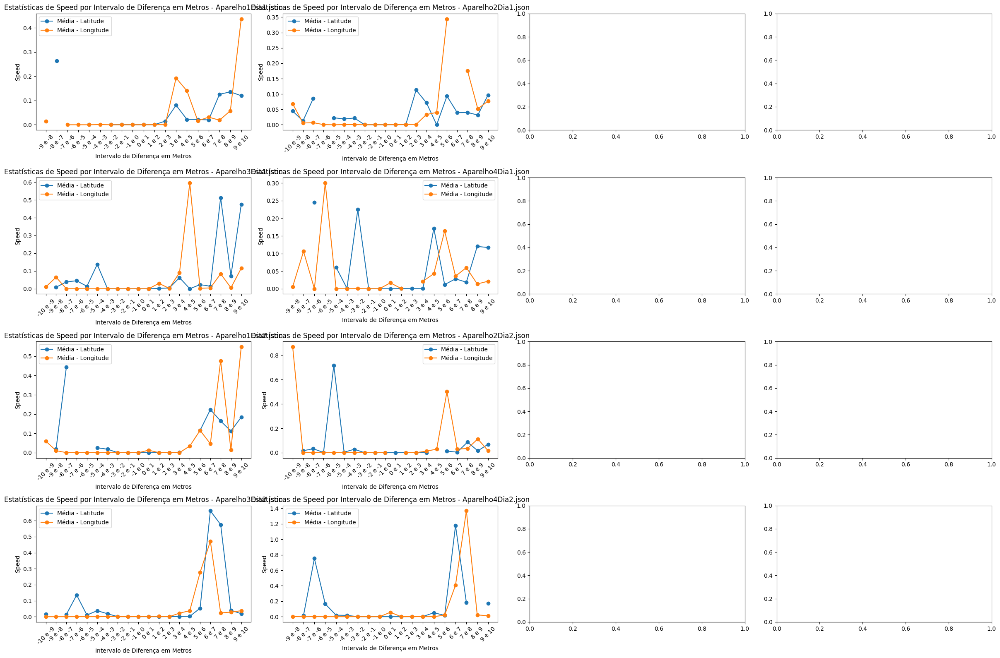

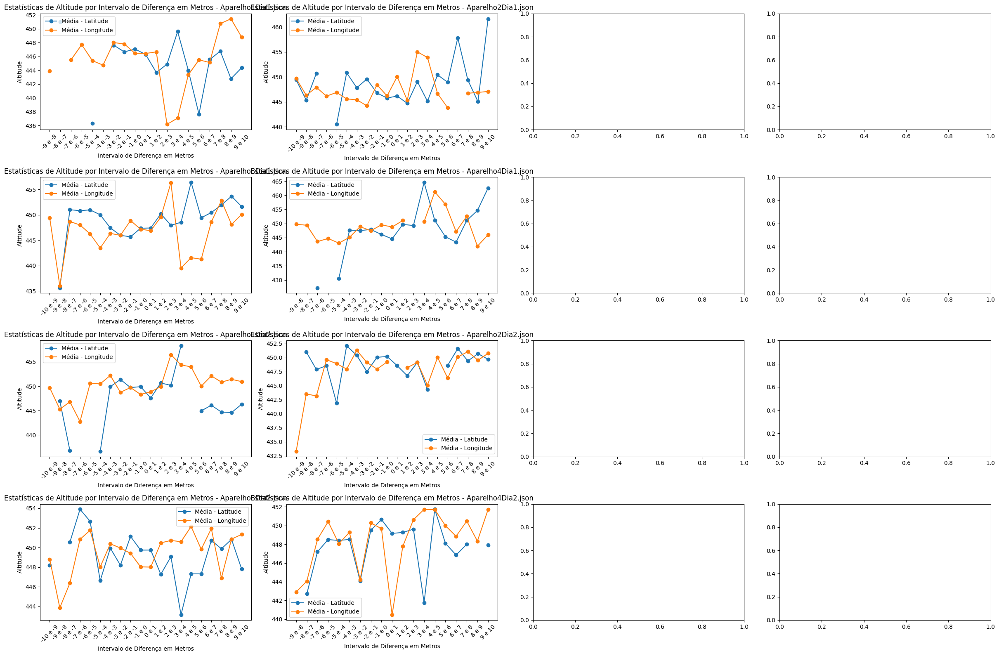

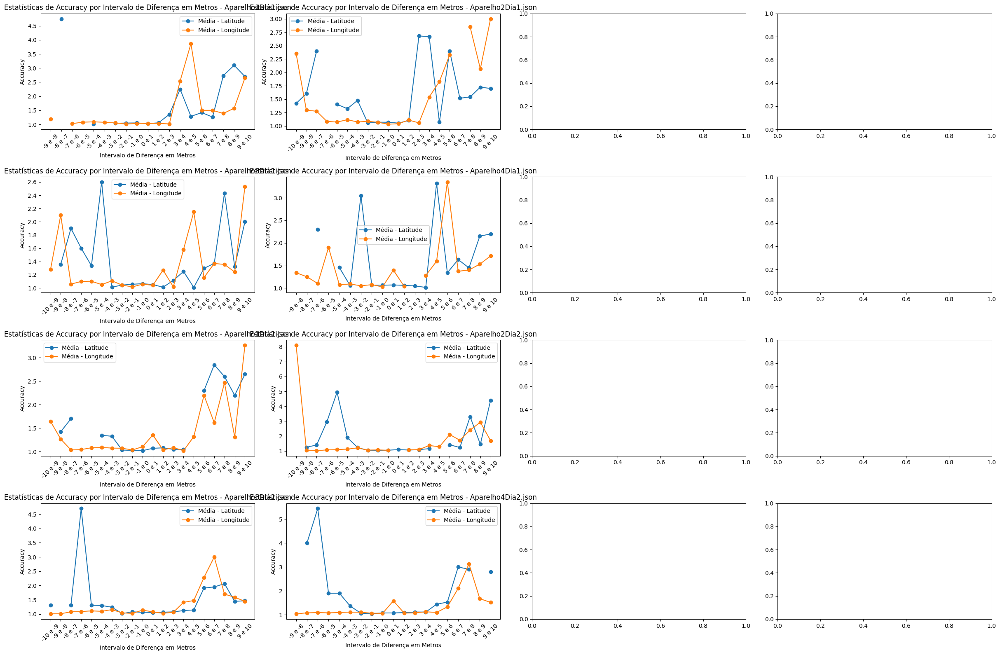

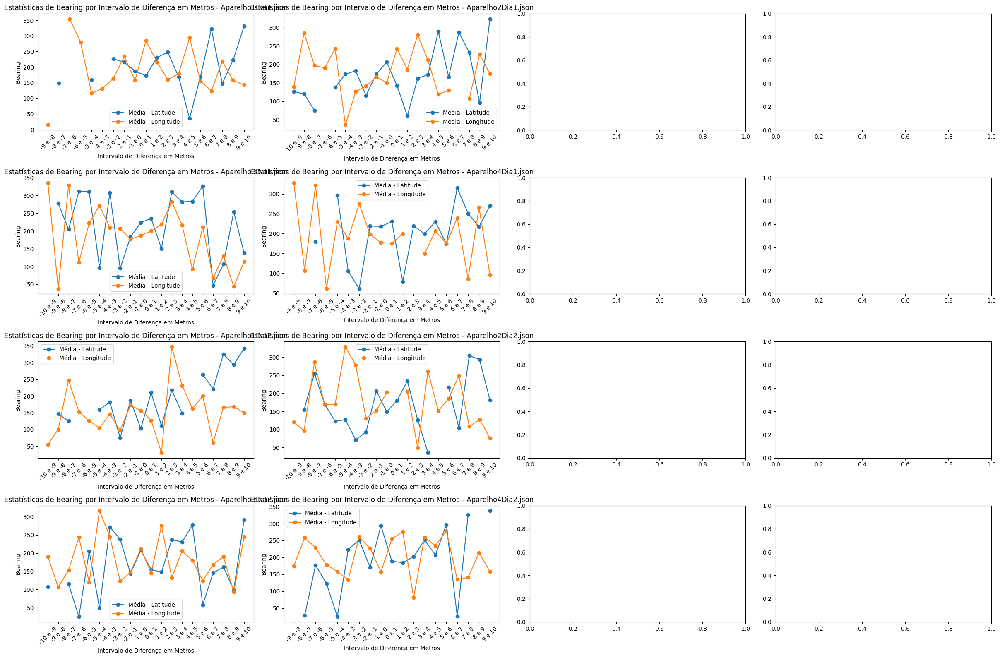

In [141]:
# Função para calcular estatísticas
def calcular_estatisticas(dados):
    estatisticas = {
        'Média': dados.mean(),
    }
    return estatisticas

# Lista de atributos
atributos = ['speed', 'altitude', 'accuracy', 'bearing']

# Intervalos de diferença em metros
intervalos = [(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0), (0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (6, 7), (7, 8), (8, 9), (9, 10)]

# Labels dos intervalos
intervalos_labels = [f'{intervalo[0]} e {intervalo[1]}' for intervalo in intervalos]

# Iterar sobre os atributos
for atributo in atributos:
    # Criar figura para os gráficos
    fig, axs = plt.subplots(2, 4, figsize=(24, 16))
    
    # Iterar sobre os aparelhos
    for i, aparelho in enumerate(df_concatenado['Arquivo'].unique()):
        # Listas para armazenar as estatísticas calculadas para cada intervalo de diferença em metros
        estatisticas_por_intervalo = {'latitude': [], 'longitude': []}

        # Iterar sobre os intervalos
        for intervalo in intervalos:
            # Filtrar os dados dentro do intervalo de diferença em metros para latitude
            dados_intervalo_lat = df_concatenado[(df_concatenado['Arquivo'] == aparelho) & (df_concatenado['latitudeDiferencaMetros'] >= intervalo[0]) & (df_concatenado['latitudeDiferencaMetros'] < intervalo[1])]
            # Filtrar os dados dentro do intervalo de diferença em metros para longitude
            dados_intervalo_lon = df_concatenado[(df_concatenado['Arquivo'] == aparelho) & (df_concatenado['longitudeDiferencaMetros'] >= intervalo[0]) & (df_concatenado['longitudeDiferencaMetros'] < intervalo[1])]

            # Calcular estatísticas descritivas para latitude dentro do intervalo
            estatisticas_lat = calcular_estatisticas(dados_intervalo_lat['gnss_data'].apply(lambda x: x[atributo]))
            estatisticas_por_intervalo['latitude'].append(estatisticas_lat)

            # Calcular estatísticas descritivas para longitude dentro do intervalo
            estatisticas_lon = calcular_estatisticas(dados_intervalo_lon['gnss_data'].apply(lambda x: x[atributo]))
            estatisticas_por_intervalo['longitude'].append(estatisticas_lon)

        # Plotar médias de latitude e longitude
        row = i // 2
        col = i % 2
        for j, tipo in enumerate(['latitude', 'longitude']):
            for chave, valor in estatisticas_por_intervalo[tipo][0].items():
                axs[row, col].plot(intervalos_labels, [estatisticas[chave] for estatisticas in estatisticas_por_intervalo[tipo]], marker='o', label=f'{chave} - {tipo.capitalize()}')

        axs[row, col].set_xlabel('Intervalo de Diferença em Metros')
        axs[row, col].set_ylabel(atributo.capitalize())
        axs[row, col].set_title(f'Estatísticas de {atributo.capitalize()} por Intervalo de Diferença em Metros - {aparelho}')
        axs[row, col].legend()
        axs[row, col].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()
